In [1]:
%matplotlib inline

In [3]:
!pip install fasterrisk

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 478.4/478.4 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 99.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 24.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 81.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 100.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 82.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.3/98.3 kB 9.6 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.2.3
    Uninstalling pyparsing-3.2.3:
      Successfully uninstalled pyparsing-3.2.3
  Attempting uninstall: pillow
    Found existing installation: pillow 11.1.0
    Uninstalling pillow-11.1.0:
      Successfully uninstalled pillow-11.1.0
  Attempting uninstall: numpy
    Found existing i

In [2]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from scipy import stats
import math
import time
from tqdm import tqdm

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, average_precision_score, roc_curve, precision_recall_curve
from sklearn.inspection import permutation_importance
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline

from fasterrisk.fasterrisk import RiskScoreOptimizer, RiskScoreClassifier

from cleaning import *

ModuleNotFoundError: No module named 'fasterrisk'

In [ ]:
code_dir = os.getcwd()

os.chdir('../Plots')
plots_dir = os.getcwd()

os.chdir('../Data')
data_dir = os.getcwd()

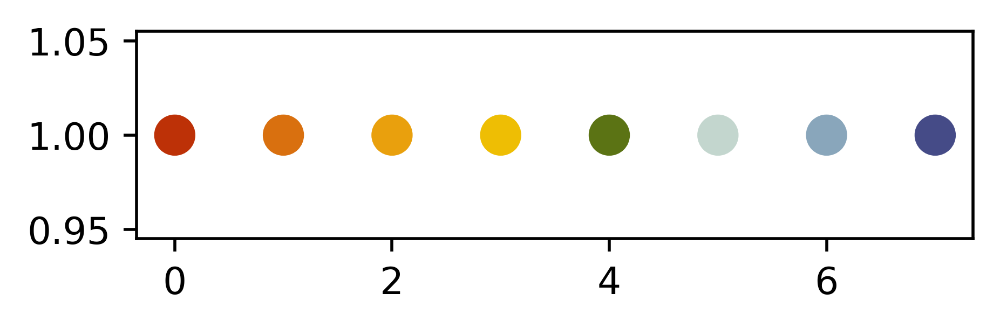

In [ ]:
colors = ['#bd3107ff', '#d9700fff', '#e9a00dff', '#eebe04ff', '#5b7314ff', '#c3d6ceff', '#89a6bbff', '#454b87ff']
plt.figure(figsize=(4,1), dpi=500)
plt.scatter(y=np.ones(len(colors)), x=np.arange(len(colors)), color=colors, s=100)
plt.show()

palette = {'INSPIRE':colors[7],
           'eICU':colors[0]}

In [ ]:
ward_vitals = pd.read_csv('INSPIRE/ward_vitals.csv')
labs = pd.read_csv('INSPIRE/labs.csv')
operations = pd.read_csv('INSPIRE/operations.csv')

In [ ]:
wv_df = ward_vitals.loc[ward_vitals['item_name'] == 'vent'].dropna()
pts_with_vent_data = list(set(wv_df['subject_id']))
print(len(pts_with_vent_data))

8945


In [ ]:
ward_vitals.head()
ward_vitals = ward_vitals.loc[ward_vitals['subject_id'].isin(pts_with_vent_data)]
ward_vitals

,subject_id,chart_time,item_name,value
124,140106882,-35,spo2,94.0
125,140106882,-35,nibp_sbp,85.0
126,140106882,-35,hr,120.0
127,140106882,-35,nibp_dbp,44.0
128,140106882,-35,bt,36.7
...,...,...,...,...
45795522,151288972,7440,iabp,1.0
45795523,151288972,7680,iabp,1.0
45795524,151288972,7740,iabp,1.0
45795525,151288972,7860,iabp,1.0


In [ ]:
labs.head()
labs = labs.loc[labs['subject_id'].isin(pts_with_vent_data)]
labs

lab_features = ['albumin','glucose','ptinr','creatinine','wbc','hco3']

In [ ]:
operations.head()
operations = operations.loc[operations['subject_id'].isin(pts_with_vent_data)]
operations

,op_id,subject_id,hadm_id,case_id,opdate,age,sex,weight,height,race,...,admission_time,discharge_time,anstart_time,anend_time,cpbon_time,cpboff_time,icuin_time,icuout_time,inhosp_death_time,allcause_death_time
1,446270725,158995752,257857903,NaN,0,70,M,45.0,170.0,Asian,...,0,70555,1345.0,1540.0,NaN,NaN,1550.0,19595.0,69860.0,106560.0
14,487807079,145247513,259299532,NaN,74880,25,M,45.0,170.0,Asian,...,0,109435,76070.0,76125.0,NaN,NaN,63275.0,78560.0,NaN,2949120.0
22,480242953,187733661,238035661,NaN,10080,55,F,45.0,150.0,Asian,...,0,34555,10560.0,11070.0,10665.0,10965.0,11080.0,19515.0,NaN,NaN
23,462956682,162604840,267911567,NaN,5760,60,M,60.0,150.0,Asian,...,0,23035,6785.0,7090.0,NaN,NaN,7095.0,8125.0,NaN,NaN
24,485183540,160631734,285012362,NaN,1440,70,M,70.0,170.0,Asian,...,0,11515,1935.0,2455.0,2080.0,2335.0,2455.0,4060.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130627,410155274,101329743,206787794,NaN,4459680,65,F,50.0,155.0,Asian,...,4449600,4474075,4460160.0,4460565.0,4460290.0,4460470.0,4460565.0,4466235.0,NaN,NaN
130739,491396553,156461031,282848329,NaN,3876480,30,F,40.0,155.0,Asian,...,3875040,3879355,3877350.0,3877415.0,NaN,NaN,NaN,NaN,NaN,NaN
130915,494319208,150497300,289152391,NaN,3483360,80,F,50.0,150.0,Asian,...,3483360,3572635,3484775.0,3485040.0,NaN,NaN,3485060.0,3513045.0,NaN,NaN
130937,465468763,150497300,289152391,NaN,3483360,80,F,50.0,150.0,Asian,...,3483360,3572635,3484705.0,3484760.0,NaN,NaN,3485060.0,3513045.0,NaN,NaN


In [ ]:
time_vars = []
for col in operations.columns:
    if 'time' in str(col):
        time_vars.append(col)

operations[time_vars]

,orin_time,orout_time,opstart_time,opend_time,admission_time,discharge_time,anstart_time,anend_time,cpbon_time,cpboff_time,icuin_time,icuout_time,inhosp_death_time,allcause_death_time
1,1340,1550,1370.0,1540.0,0,70555,1345.0,1540.0,NaN,NaN,1550.0,19595.0,69860.0,106560.0
14,76065,76125,76095.0,76120.0,0,109435,76070.0,76125.0,NaN,NaN,63275.0,78560.0,NaN,2949120.0
22,10555,11080,10615.0,11070.0,0,34555,10560.0,11070.0,10665.0,10965.0,11080.0,19515.0,NaN,NaN
23,6780,7100,6840.0,7090.0,0,23035,6785.0,7090.0,NaN,NaN,7095.0,8125.0,NaN,NaN
24,1910,2450,2010.0,2440.0,0,11515,1935.0,2455.0,2080.0,2335.0,2455.0,4060.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130627,4460135,4460565,4460225.0,4460565.0,4449600,4474075,4460160.0,4460565.0,4460290.0,4460470.0,4460565.0,4466235.0,NaN,NaN
130739,3877345,3877425,3877360.0,3877410.0,3875040,3879355,3877350.0,3877415.0,NaN,NaN,NaN,NaN,NaN,NaN
130915,3484770,3485040,3484810.0,3485035.0,3483360,3572635,3484775.0,3485040.0,NaN,NaN,3485060.0,3513045.0,NaN,NaN
130937,3484705,3484765,3484710.0,3484750.0,3483360,3572635,3484705.0,3484760.0,NaN,NaN,3485060.0,3513045.0,NaN,NaN


In [ ]:
os.chdir(plots_dir)

Analyzing patient 153616384


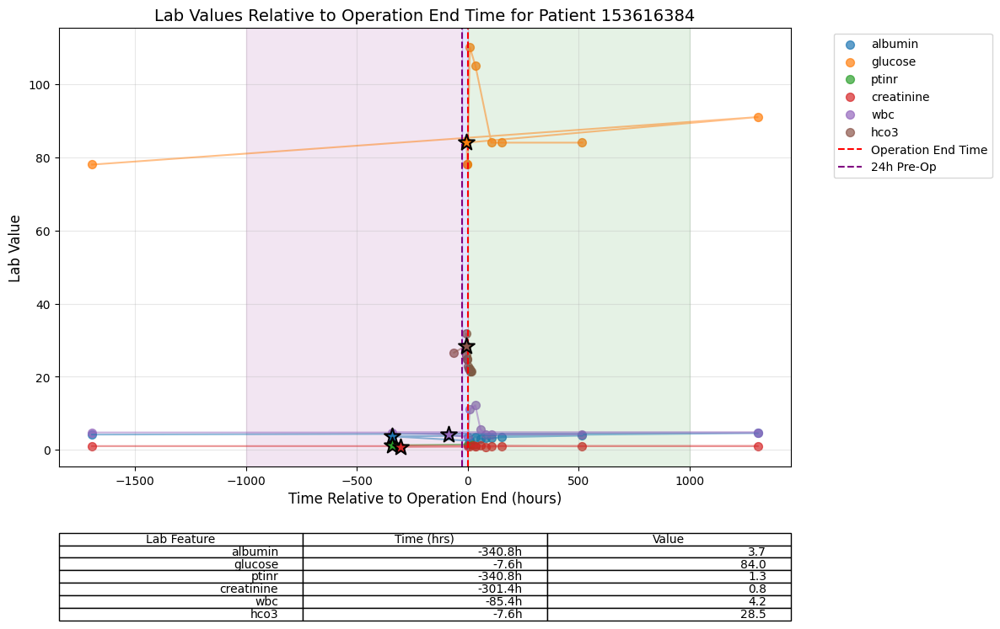

Analyzing patient 188579841


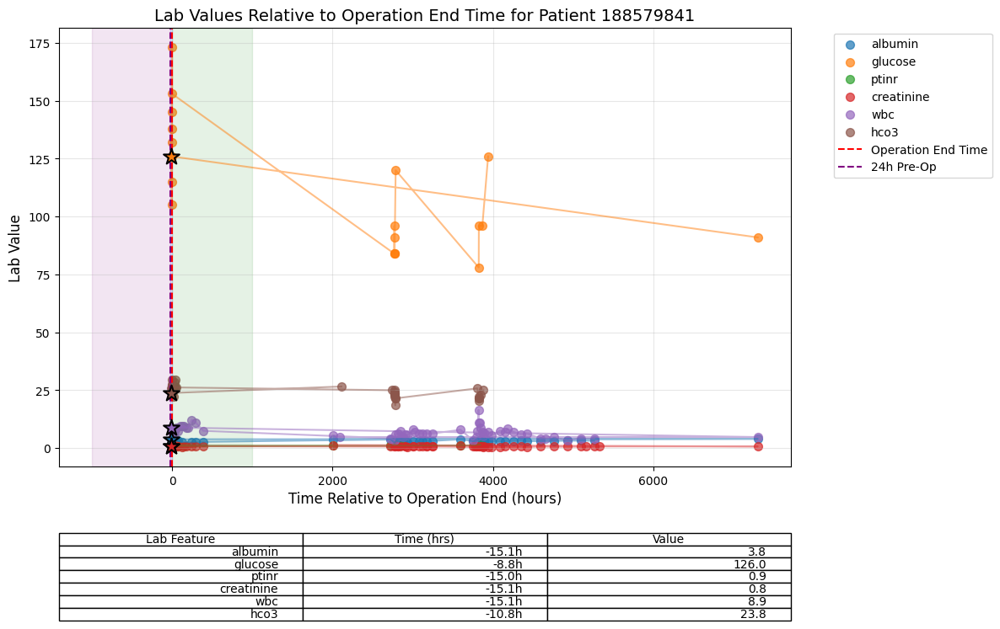

Analyzing patient 166035460


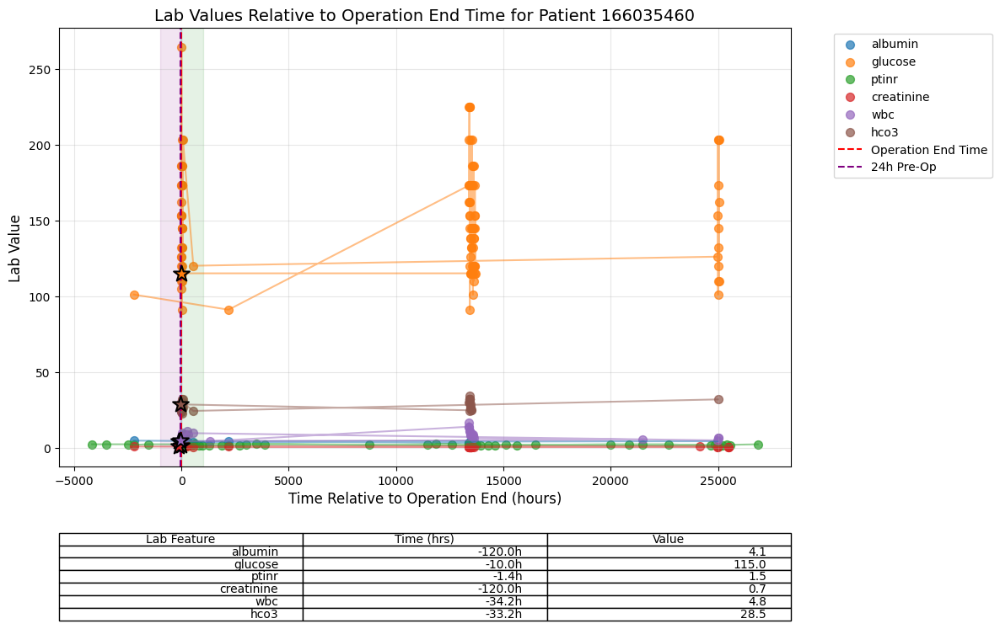

Analyzed 3 patients out of 8937 possible patients


In [ ]:
from matplotlib.gridspec import GridSpec
from matplotlib.cm import tab10

def plot_labs_pre_vs_post_op(patient_id, lab_df, operation_df, lab_features):
    # Filter data for the specific patient
    patient_labs = lab_df[lab_df['subject_id'] == patient_id]
    patient_ops = operation_df[operation_df['subject_id'] == patient_id]

    if patient_ops.empty:
        print(f"No operation data for patient {patient_id}")
        return

    # Get the operation end time for reference
    anend_time = patient_ops['anend_time'].values[0]

    # Create figure
    plt.figure(figsize=(12, 8))

    # Create color map
    colors = tab10.colors

    # Dict to store selected measurements for each feature
    selected_measurements = {}

    # Plot each lab feature
    for i, feature in enumerate(lab_features):
        feature_data = patient_labs[patient_labs['item_name'] == feature]

        if feature_data.empty:
            print(f"No {feature} data for patient {patient_id}")
            continue

        # Calculate time relative to operation end time (in hours)
        feature_data = feature_data.copy()
        feature_data['relative_time'] = (feature_data['chart_time'] - anend_time) / 60  # Convert to hours

        # Plot the lab values with different colors by feature
        plt.scatter(feature_data['relative_time'], feature_data['value'],
                    s=50, color=colors[i % len(colors)], alpha=0.7, label=feature)
        plt.plot(feature_data['relative_time'], feature_data['value'],
                '-', alpha=0.5, color=colors[i % len(colors)])

        # SELECTION LOGIC FOR PRE-OP MEASUREMENTS:
        # Focus on measurements around 24 hours before surgery
        pre_op = feature_data[feature_data['relative_time'] < 0]

        if not pre_op.empty:
            # Find closest to -24h (24 hours before surgery)
            closest_idx = (pre_op['relative_time'] - (-24)).abs().idxmin()
            selected_measurement = pre_op.loc[closest_idx]
        else:
            # If no pre-op measurements exist, use earliest post-op as fallback
            selected_measurement = feature_data.iloc[feature_data['relative_time'].argmin()]

        # Store the selected measurement
        selected_measurements[feature] = selected_measurement

        # Star the selected measurement
        plt.scatter(selected_measurement['relative_time'], selected_measurement['value'],
                   s=200, marker='*', color=colors[i % len(colors)],
                   edgecolor='black', linewidth=1.5, zorder=10)

    # Add reference lines
    plt.axvline(x=0, color='red', linestyle='--', label='Operation End Time')
    plt.axvline(x=-24, color='purple', linestyle='--', label='24h Pre-Op')

    # Add labels and legend
    plt.title(f'Lab Values Relative to Operation End Time for Patient {patient_id}', fontsize=14)
    plt.xlabel('Time Relative to Operation End (hours)', fontsize=12)
    plt.ylabel('Lab Value', fontsize=12)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add grid for better readability
    plt.grid(True, alpha=0.3)

    # Mark the zones
    plt.axvspan(-1000, -24, alpha=0.1, color='purple', label='>24h Pre-Op')
    plt.axvspan(-24, 0, alpha=0.1, color='blue', label='0-24h Pre-Op')
    plt.axvspan(0, 1000, alpha=0.1, color='green', label='Post-Op')

    # Add a table with the selected measurements
    table_data = []
    for feature in lab_features:
        if feature in selected_measurements:
            sm = selected_measurements[feature]
            table_data.append([
                feature,
                f"{sm['relative_time']:.1f}h",
                f"{sm['value']:.1f}"
            ])

    table_cols = ['Lab Feature', 'Time (hrs)', 'Value']
    table = plt.table(cellText=table_data, colLabels=table_cols,
                     loc='bottom', bbox=[0.0, -0.35, 1.0, 0.2])
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.5)

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.3)  # Make room for the table
    plt.savefig(f'LabValues_{patient_id}.png', transparent=True, dpi=500)
    plt.show()

    # Return the selected measurements for further analysis
    return selected_measurements

# Function to process and plot multiple patients
def analyze_multiple_patients(lab_df, operation_df, lab_features, max_patients=5):
    # Find patients with both lab and operation data
    lab_patients = set(lab_df['subject_id'].unique())
    op_patients = set(operation_df['subject_id'].unique())

    patients_with_both = lab_patients.intersection(op_patients)

    selected_patients = []
    all_selected_measurements = {}

    # Filter to patients who have most of the specified lab features
    for patient in patients_with_both:
        patient_labs = lab_df[lab_df['subject_id'] == patient]
        feature_count = sum(feature in patient_labs['item_name'].values for feature in lab_features)
        if feature_count >= len(lab_features) * 0.6:  # At least 60% of features
            selected_patients.append((patient, feature_count))

    # Sort patients by number of available features (descending)
    selected_patients.sort(key=lambda x: x[1], reverse=True)

    # Plot for top patients
    for patient_id, _ in selected_patients[:max_patients]:
        print(f"Analyzing patient {patient_id}")
        selected_measurements = plot_labs_pre_vs_post_op(
            patient_id, lab_df, operation_df, lab_features)

        all_selected_measurements[patient_id] = selected_measurements

    print(f"Analyzed {len(selected_patients[:max_patients])} patients out of {len(patients_with_both)} possible patients")

    return all_selected_measurements


# Call the function to analyze multiple patients
selected_measurements = analyze_multiple_patients(labs, operations, lab_features, max_patients=3)

Shape after column selection: (13961, 9)
Shape after duration filtering: (11745, 14)
Final shape of operations_sub: (11745, 12)

Selected lab values summary:
Total patients with operations: 8278
Patients with at least one selected lab: 8276
Total selected lab measurements: 69644
  - albumin: 11702 values (141.4% of patients)
  - glucose: 11565 values (139.7% of patients)
  - ptinr: 11699 values (141.3% of patients)
  - creatinine: 11733 values (141.7% of patients)
  - wbc: 11701 values (141.4% of patients)
  - hco3: 11244 values (135.8% of patients)


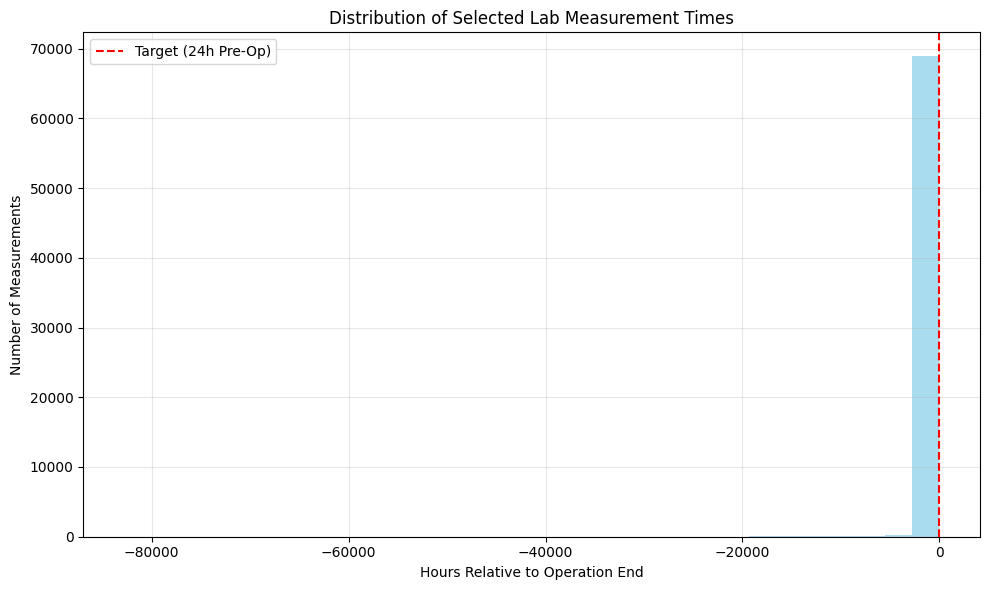

In [ ]:
# First process operations data
operations = operations[(operations['height'] > 0) & (operations['weight'] > 0) &
                         operations['height'].notna() & operations['weight'].notna()]

operations_features = []
for col in ['op_id','subject_id','age','height','weight','anstart_time','anend_time','icd10_pcs','antype']:
  if col not in operations.columns:
    print(f'{col} not in columns')
  else:
    operations_features.append(col)

# Create a copy of the filtered data
valid_heights = operations['height'].between(50, 250, inclusive='both')
valid_weights = operations['weight'].between(20, 300, inclusive='both')
operations_filtered = operations[valid_heights & valid_weights].copy()

# Select columns
operations_sub = operations_filtered[operations_features].copy()
print(f"Shape after column selection: {operations_sub.shape}")

# Convert height from cm to meters for BMI calculation
operations_sub['height_m'] = operations_sub['height']/100  # Convert cm to meters

# Calculate BMI
operations_sub['BMI'] = operations_sub.apply(
    lambda row: row['weight'] / (row['height_m'] ** 2),
    axis=1
)
operations_sub['BMI'] = operations_sub.apply(
    lambda row: np.nan if (row['BMI'] > 70 or row['BMI'] < 10) else row['BMI'],
    axis=1
)

# Process anesthesia times
if 'anstart_time' in operations_sub.columns and 'anend_time' in operations_sub.columns:
    try:
        # Convert float military time to minutes
        def military_time_to_minutes(time_float):
            if pd.isna(time_float):
                return np.nan

            # Extract hours and minutes
            hours = int(time_float // 100)
            minutes = int(time_float % 100)

            # Handle potential overflow (e.g., 2400 should be 0)
            hours = hours % 24

            # Convert to total minutes
            return hours * 60 + minutes

        # Calculate start and end times in minutes
        operations_sub['start_minutes'] = operations_sub['anstart_time'].apply(military_time_to_minutes)
        operations_sub['end_minutes'] = operations_sub['anend_time'].apply(military_time_to_minutes)

        # Calculate duration - handling cases where end time is on the next day
        operations_sub['anesthesia_duration'] = operations_sub.apply(
            lambda row: row['end_minutes'] - row['start_minutes'] if row['end_minutes'] >= row['start_minutes']
                        else row['end_minutes'] + 24*60 - row['start_minutes'],
            axis=1
        )

        # Filter out invalid durations
        operations_sub = operations_sub[operations_sub['anesthesia_duration'] >= 60]
        print(f"Shape after duration filtering: {operations_sub.shape}")

        # Optionally drop the intermediate columns
        operations_sub = operations_sub.drop(['start_minutes', 'end_minutes'], axis=1)

    except Exception as e:
        print(f"Error processing times: {e}")
        operations_sub['anesthesia_duration'] = np.nan
else:
    print("Time columns not found in dataframe")

print(f"Final shape of operations_sub: {operations_sub.shape}")




def select_preop_lab_values(operations_df, labs_df, lab_features, target_hours_before=-24):
    """
    Select lab values closest to the target hours before surgery for each patient.
    Returns both a dataframe of selected values and a dictionary mapping for easy lookup.
    """
    # Create empty lists to store results
    selected_labs_rows = []

    # Create a dictionary to store selected measurements by patient and feature
    selected_labs_dict = {}

    # Process each patient
    for _, operation_row in operations_df.iterrows():
        patient_id = operation_row['subject_id']
        anend_time = operation_row['anend_time']

        # Initialize patient dictionary if not exists
        if patient_id not in selected_labs_dict:
            selected_labs_dict[patient_id] = {}

        # Get labs for this patient
        patient_labs = labs_df[labs_df['subject_id'] == patient_id]

        # For each lab feature
        for feature in lab_features:
            feature_data = patient_labs[patient_labs['item_name'] == feature]

            if feature_data.empty:
                continue

            # Calculate relative time in hours
            feature_data = feature_data.copy()
            feature_data['relative_time'] = (feature_data['chart_time'] - anend_time) / 60  # Convert to hours

            # Find pre-op measurements
            pre_op = feature_data[feature_data['relative_time'] < 0]

            if not pre_op.empty:
                # Find measurement closest to target hours before surgery
                closest_idx = (pre_op['relative_time'] - target_hours_before).abs().idxmin()
                selected = pre_op.loc[closest_idx]

                # Store in dictionary
                selected_labs_dict[patient_id][feature] = {
                    'value': selected['value'],
                    'chart_time': selected['chart_time'],
                    'relative_time': selected['relative_time']
                }

                # Create a row for the result DataFrame
                result_row = {
                    'subject_id': patient_id,
                    'operation_id': operation_row['op_id'] if 'op_id' in operation_row else None,
                    'lab_feature': feature,
                    'lab_value': selected['value'],
                    'lab_time': selected['chart_time'],
                    'op_time': anend_time,
                    'relative_time_hours': selected['relative_time'],
                    'BMI': operation_row['BMI'] if 'BMI' in operation_row else None,
                    'age': operation_row['age'] if 'age' in operation_row else None,
                    'anesthesia_duration': operation_row['anesthesia_duration'] if 'anesthesia_duration' in operation_row else None
                }

                selected_labs_rows.append(result_row)

    # Convert to DataFrame
    if selected_labs_rows:
        selected_labs_df = pd.DataFrame(selected_labs_rows)
        return selected_labs_df, selected_labs_dict
    else:
        return pd.DataFrame(), {}

# Select pre-op lab values
selected_labs_df, selected_labs_dict = select_preop_lab_values(operations_sub, labs, lab_features)

# Print summary statistics
print(f"\nSelected lab values summary:")
print(f"Total patients with operations: {operations_sub['subject_id'].nunique()}")
print(f"Patients with at least one selected lab: {selected_labs_df['subject_id'].nunique()}")
print(f"Total selected lab measurements: {len(selected_labs_df)}")

# Print lab feature statistics
for feature in lab_features:
    feature_count = len(selected_labs_df[selected_labs_df['lab_feature'] == feature])
    feature_pct = (feature_count / operations_sub['subject_id'].nunique()) * 100
    print(f"  - {feature}: {feature_count} values ({feature_pct:.1f}% of patients)")

# Optionally: Visualize time distribution of selected labs
try:
    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 6))
    plt.hist(selected_labs_df['relative_time_hours'], bins=30, alpha=0.7, color='skyblue')
    plt.axvline(x=-24, color='red', linestyle='--', label='Target (24h Pre-Op)')
    plt.xlabel('Hours Relative to Operation End')
    plt.ylabel('Number of Measurements')
    plt.title('Distribution of Selected Lab Measurement Times')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    #plt.savefig(f'{}.png', transparent=True, dpi=500)
    plt.show()
except Exception as e:
    print(f"Error creating visualization: {e}")

# Example of accessing values from the dictionary:
# To get glucose value for patient 12345:
# if 12345 in selected_labs_dict and 'glucose' in selected_labs_dict[12345]:
#     glucose_value = selected_labs_dict[12345]['glucose']['value']

age: min = 20, max = 90 


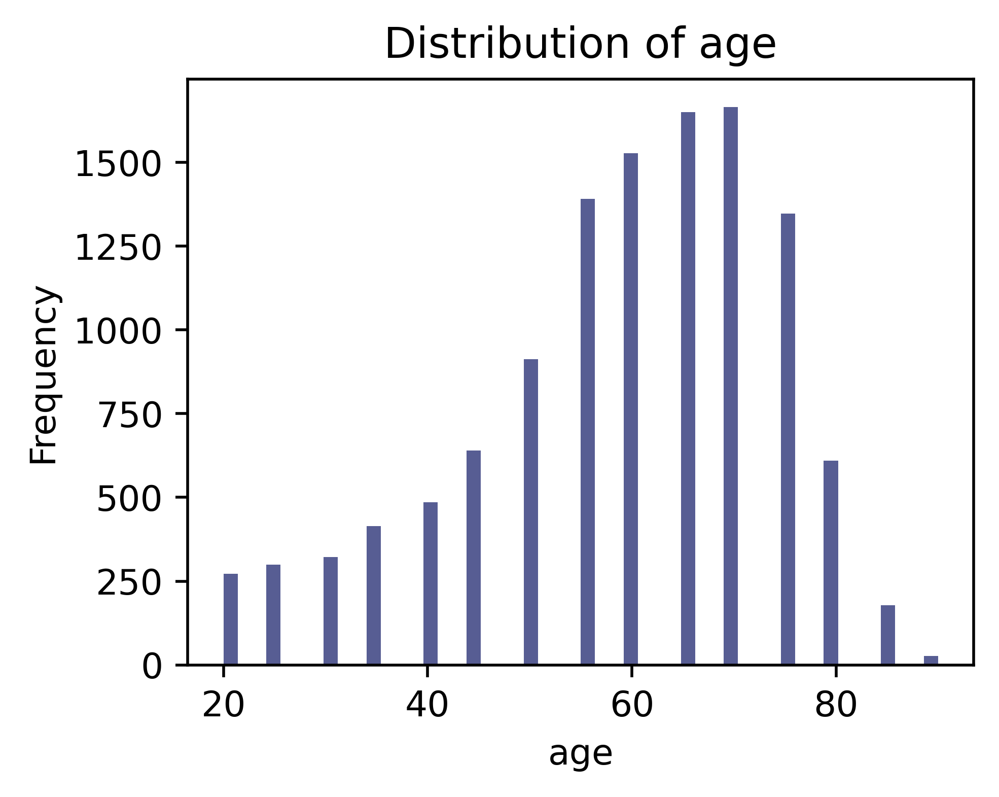

height: min = 50.0, max = 200.0 


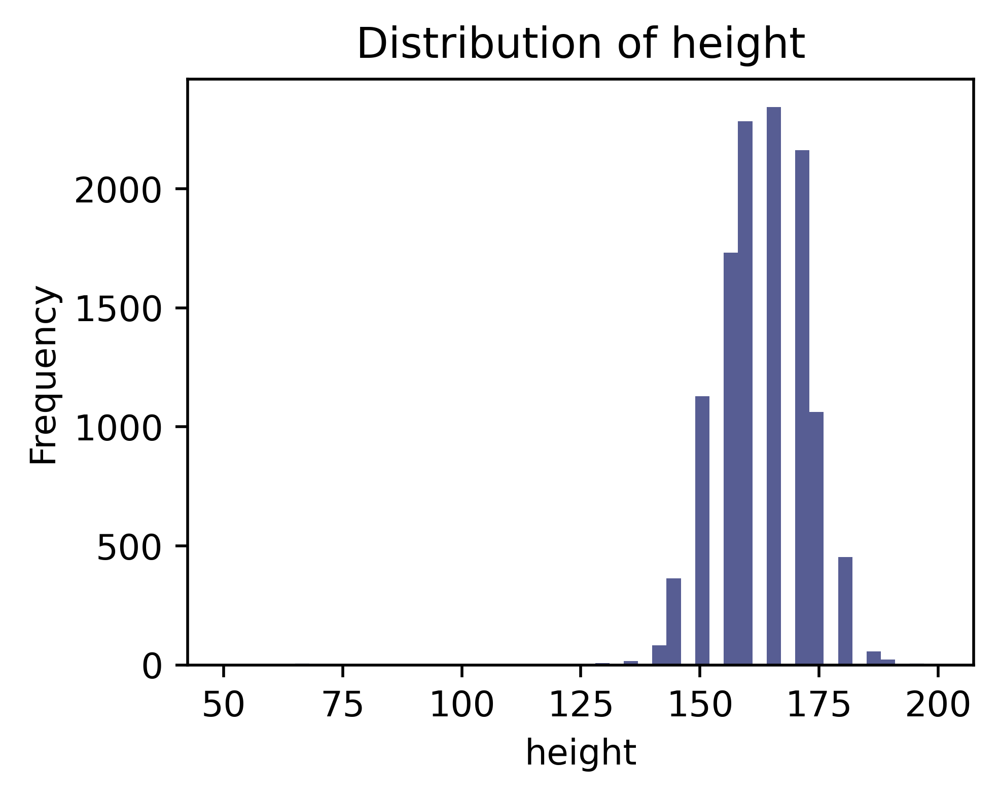

weight: min = 20.0, max = 175.0 


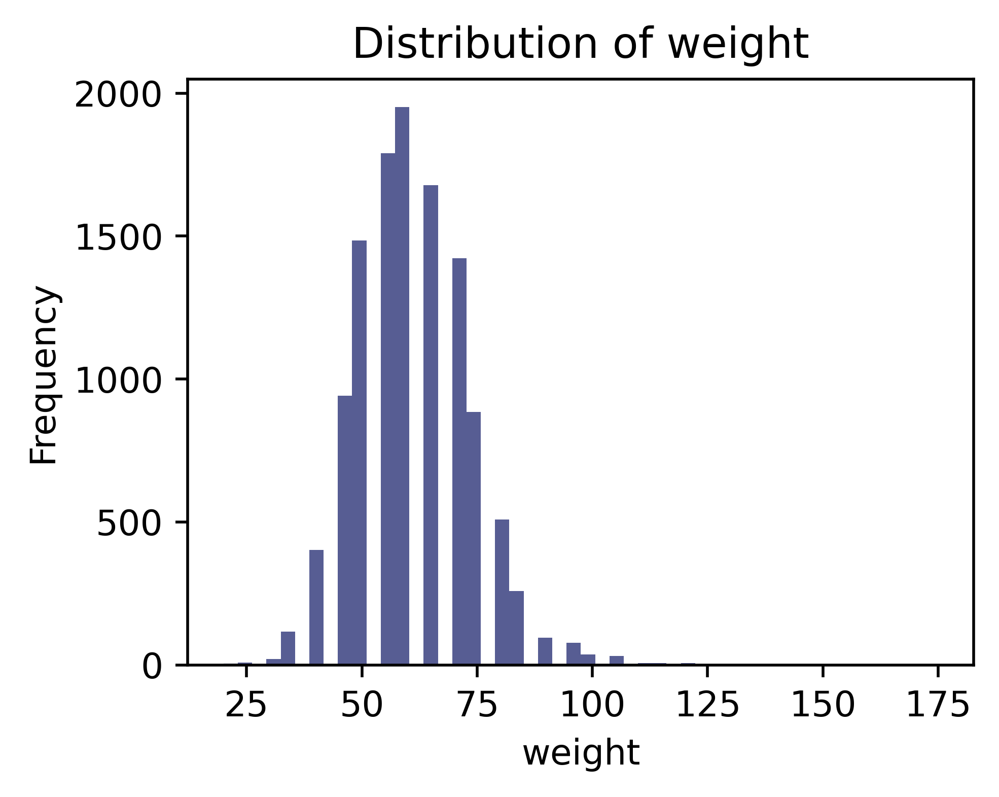

anstart_time: min = 5.0, max = 5133090.0 


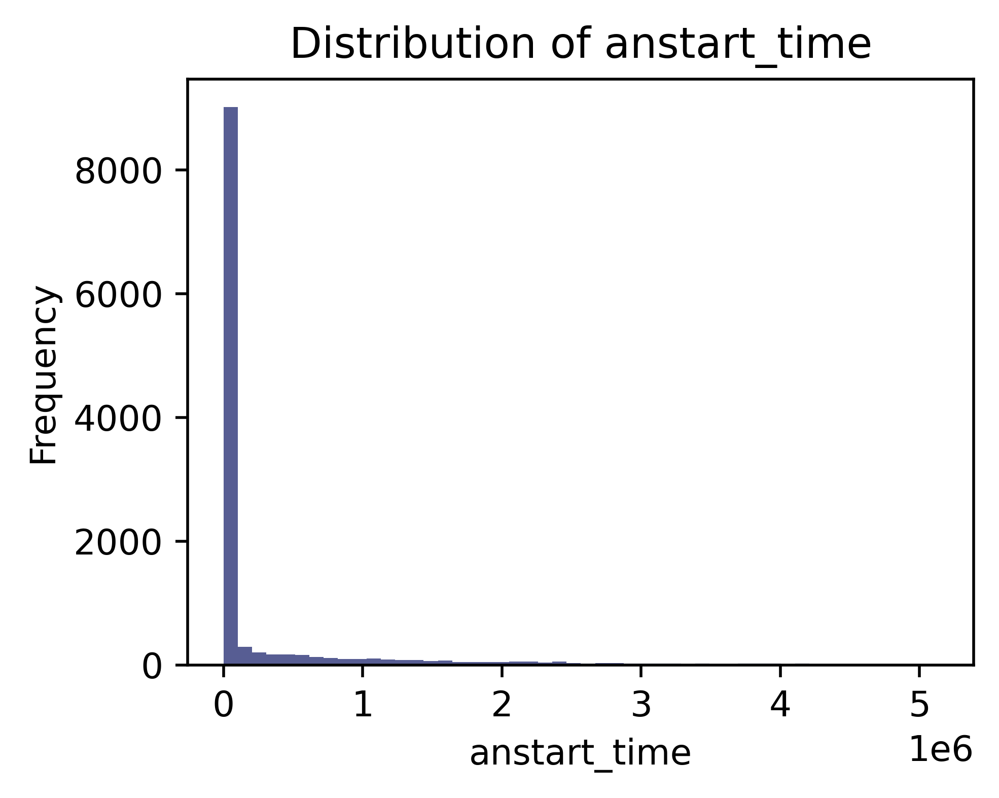

anend_time: min = 105.0, max = 5133570.0 


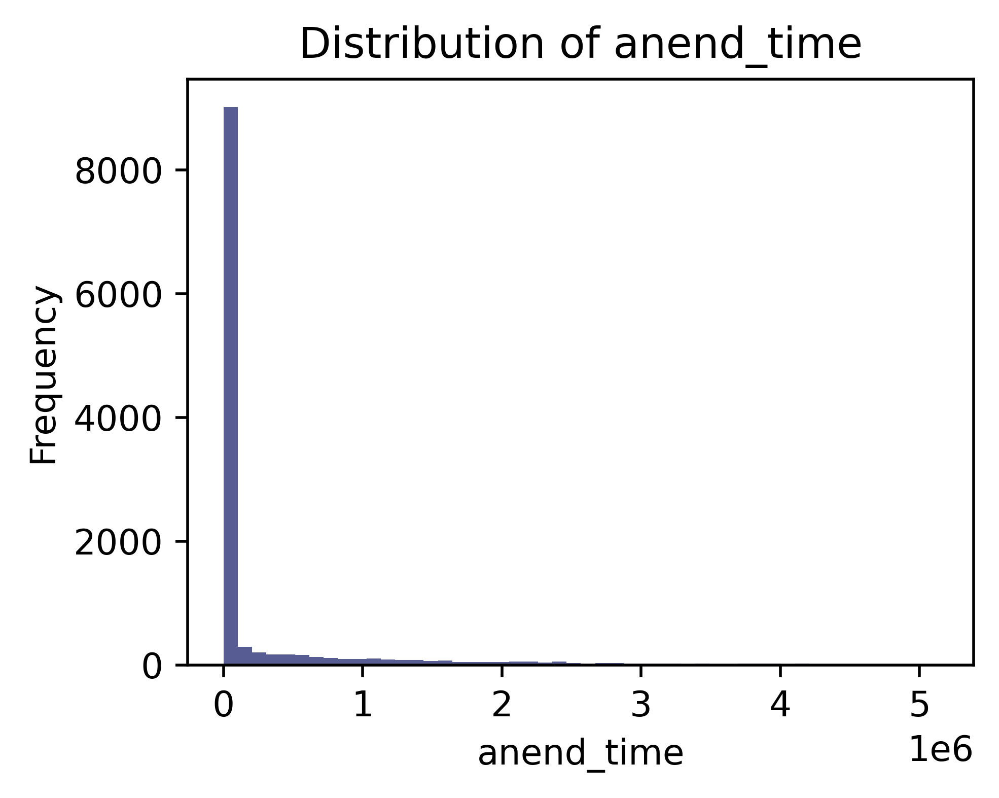

icd10_pcs: min = 00110, max = 10D00 


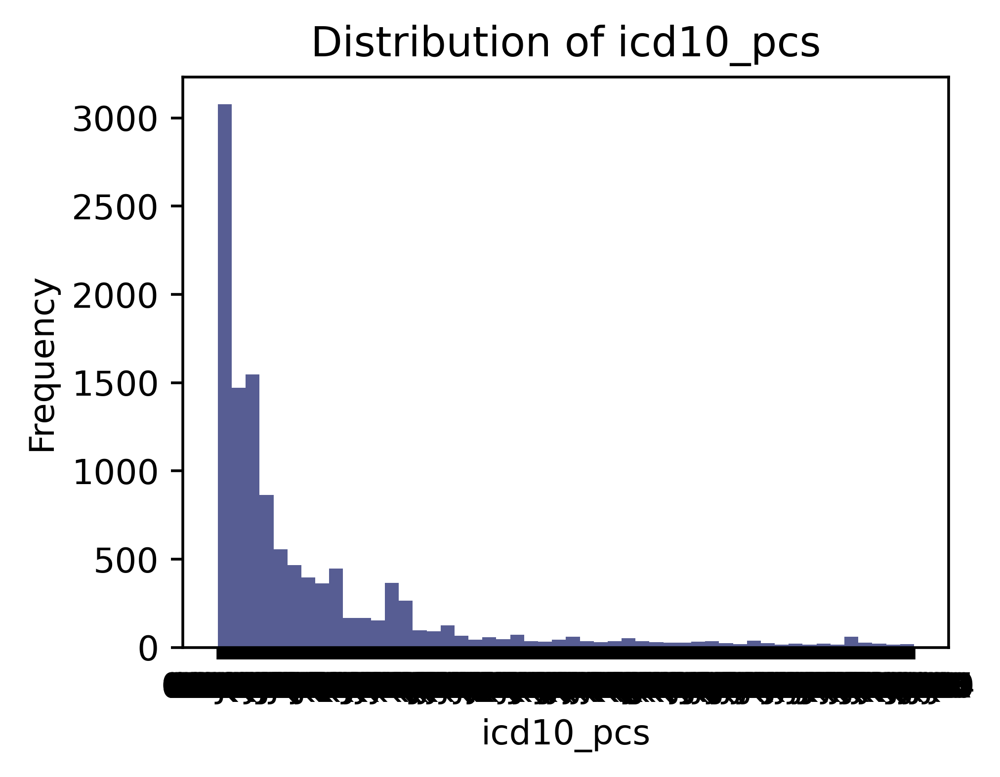

antype: min = General, max = Regional 


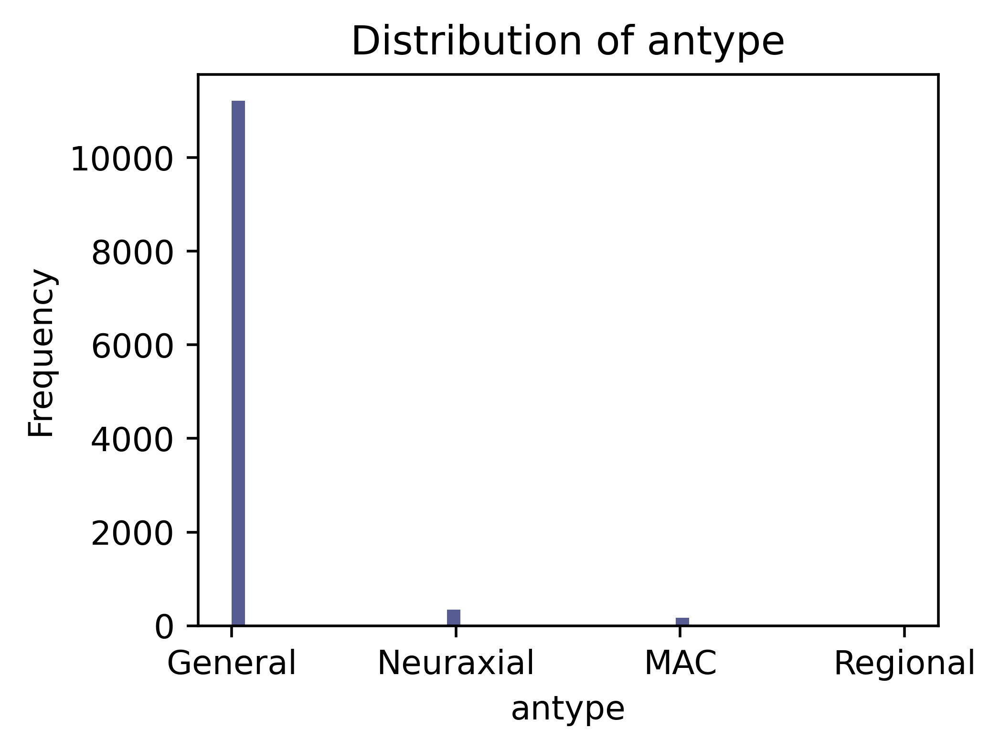

height_m: min = 0.5, max = 2.0 


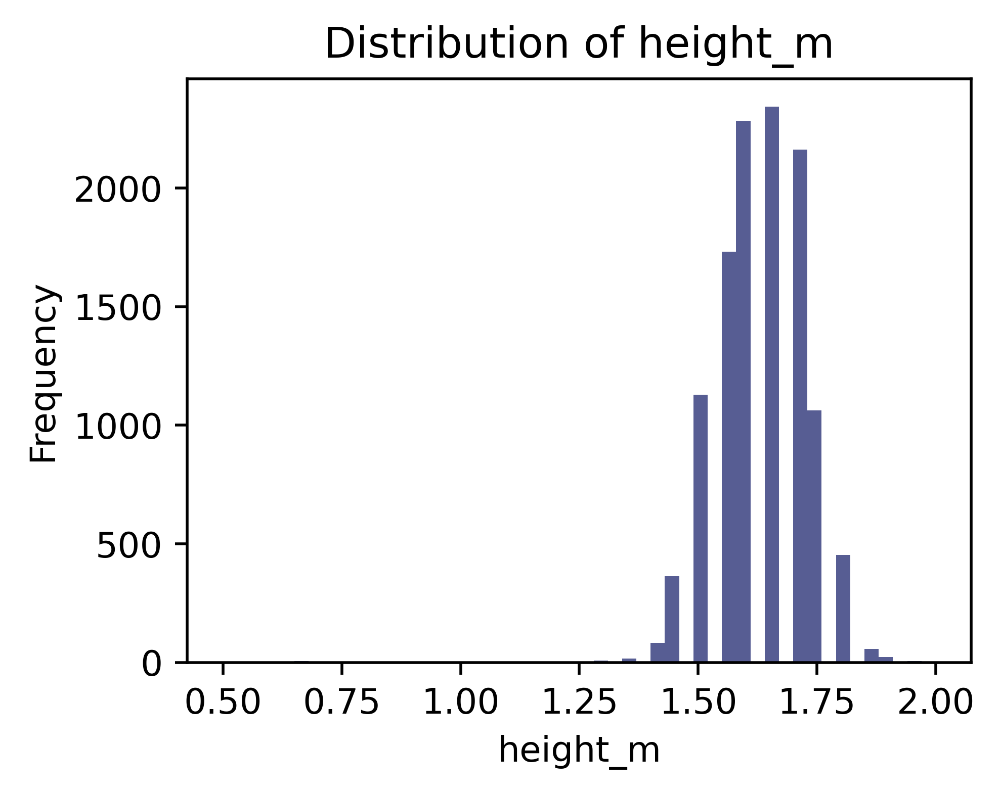

BMI: min = 10.802469135802468, max = 64.51612903225805 


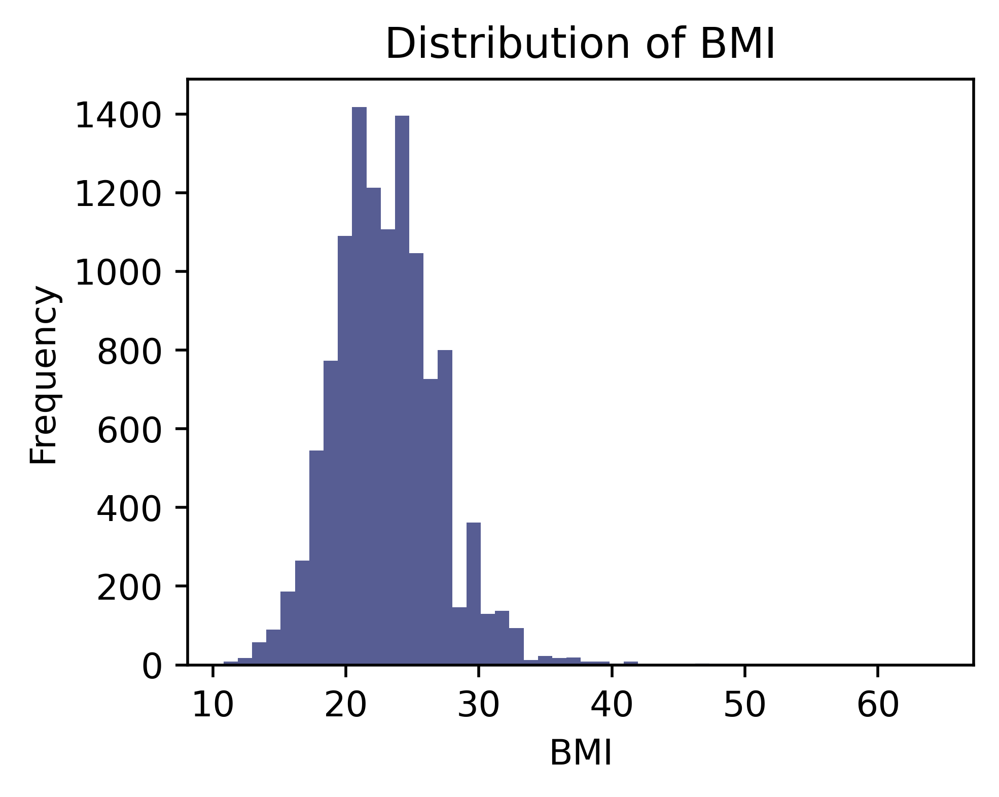

anesthesia_duration: min = 60.0, max = 1435.0 


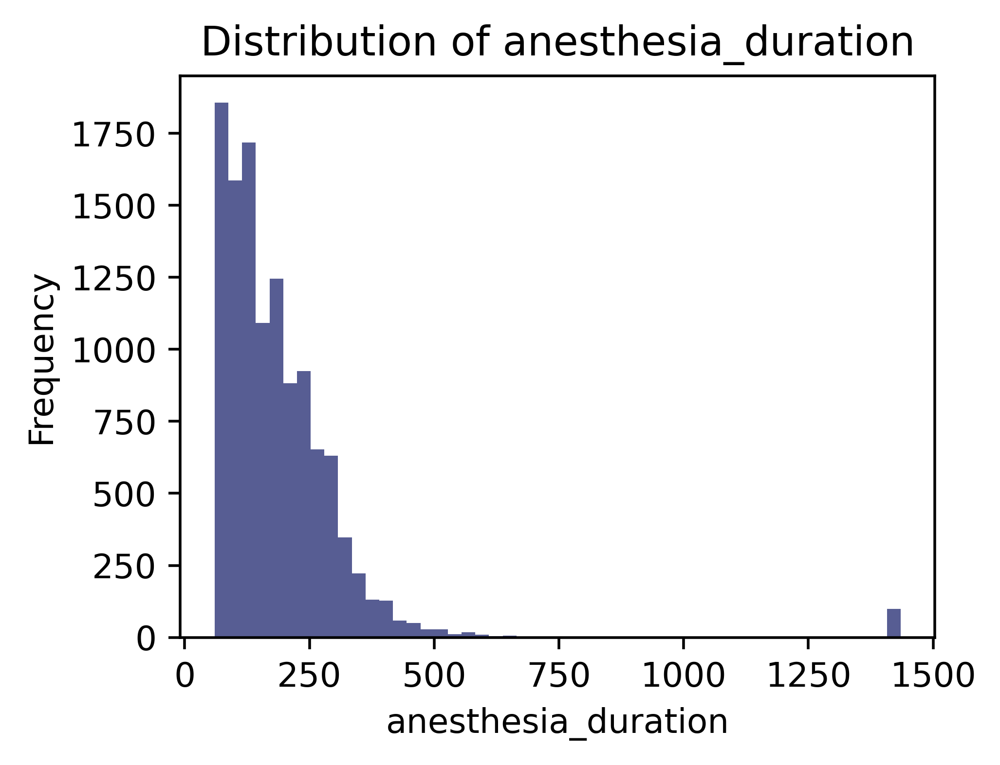

In [ ]:
for feat in operations_sub.columns[2:]:
  print(f'{feat}: min = {np.min(operations_sub[feat])}, max = {np.max(operations_sub[feat])} ')
  plt.figure(figsize=(4,3), dpi=500)
  plt.hist(operations_sub[feat], bins=50, alpha=0.9, color=palette['INSPIRE'])
  plt.xlabel(feat)
  plt.ylabel('Frequency')
  plt.title(f'Distribution of {feat}')
  plt.savefig(f'{feat}_distribution.png', transparent=True, dpi=500)
  plt.show()

In [ ]:
#lab_features = ['albumin','glucose','ptinr','creatinine','wbc','hco3']
filtered_labs = labs[labs['item_name'].isin(lab_features)]

In [ ]:
# Step 1: Merge the dataframes
merged_df = pd.merge(
    filtered_labs,
    operations_sub[['subject_id', 'anstart_time']],
    on='subject_id',
    how='inner'
)

# Step 2: Calculate time difference
# Convert to integers if not already
merged_df['chart_time_sec'] = merged_df['chart_time'].astype(int)
merged_df['anstart_time_sec'] = merged_df['anstart_time'].astype(int)

# Calculate seconds difference
# Simplified version of the time difference calculation -
# if you know times are in same format and don't need wraparound handling
merged_df['seconds_diff'] = merged_df['anstart_time_sec'] - merged_df['chart_time_sec']
merged_df['hours_diff'] = merged_df['seconds_diff'] / 3600

# Step 3: Keep only labs before surgery
pre_surgery_labs = merged_df[merged_df['hours_diff'] > 0]

# Step 4: Add a column to identify optimal labs for selection
pre_surgery_labs['meets_24h'] = pre_surgery_labs['hours_diff'] >= 24
pre_surgery_labs['distance_from_24h'] = abs(pre_surgery_labs['hours_diff'] - 24)

# Step 5: Sort by selection criteria for faster processing
# First by subject_id and item_name to group them
# Then by meets_24h (True first) to prioritize labs ≥ 24 hours
# Then by hours_diff ascending (for labs ≥ 24h) or distance_from_24h ascending (for labs < 24h)
pre_surgery_labs = pre_surgery_labs.sort_values(
    ['subject_id', 'item_name', 'meets_24h', 'distance_from_24h'],
    ascending=[True, True, False, True]
)

# Step 6: Keep the first lab for each subject_id and item_name after sorting
# This will be the optimal lab based on our criteria
selected_labs = pre_surgery_labs.drop_duplicates(['subject_id', 'item_name'])

# Step 7: Pivot the data to get item_names as columns
pivoted_labs = selected_labs.pivot(
    index='subject_id',
    columns='item_name',
    values='value'
)

# Step 8: Merge with operations_sub
operations_sub_with_labs = operations_sub.merge(
    pivoted_labs,
    on='subject_id',
    how='left'
)

# Print some diagnostic information
print(f"Final DataFrame shape: {operations_sub_with_labs.shape}")
print(f"Original operations_sub shape: {operations_sub.shape}")
print(f"Number of lab columns added: {pivoted_labs.shape[1]}")

/var/folders/nl/_hsnd4n10hz02hsrvnrw30080000gn/T/ipykernel_65835/2984647863.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_surgery_labs['meets_24h'] = pre_surgery_labs['hours_diff'] >= 24
/var/folders/nl/_hsnd4n10hz02hsrvnrw30080000gn/T/ipykernel_65835/2984647863.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_surgery_labs['distance_from_24h'] = abs(pre_surgery_labs['hours_diff'] - 24)


Final DataFrame shape: (11745, 18)
Original operations_sub shape: (11745, 12)
Number of lab columns added: 6


age: min = 20, max = 90 


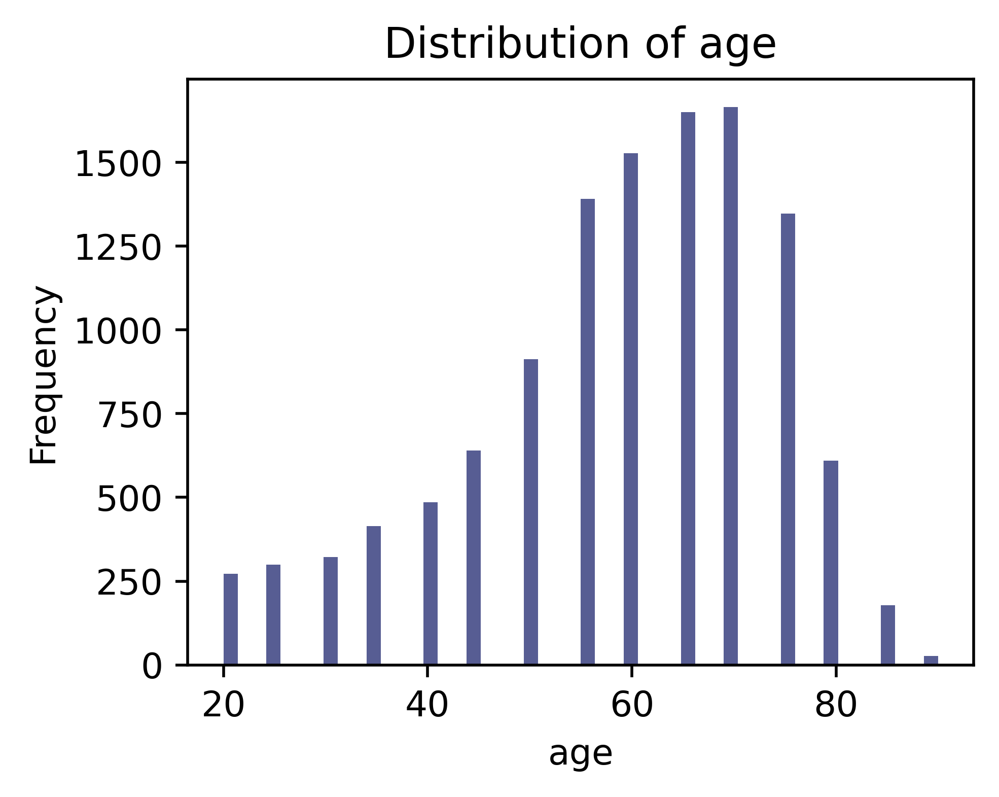

height: min = 50.0, max = 200.0 


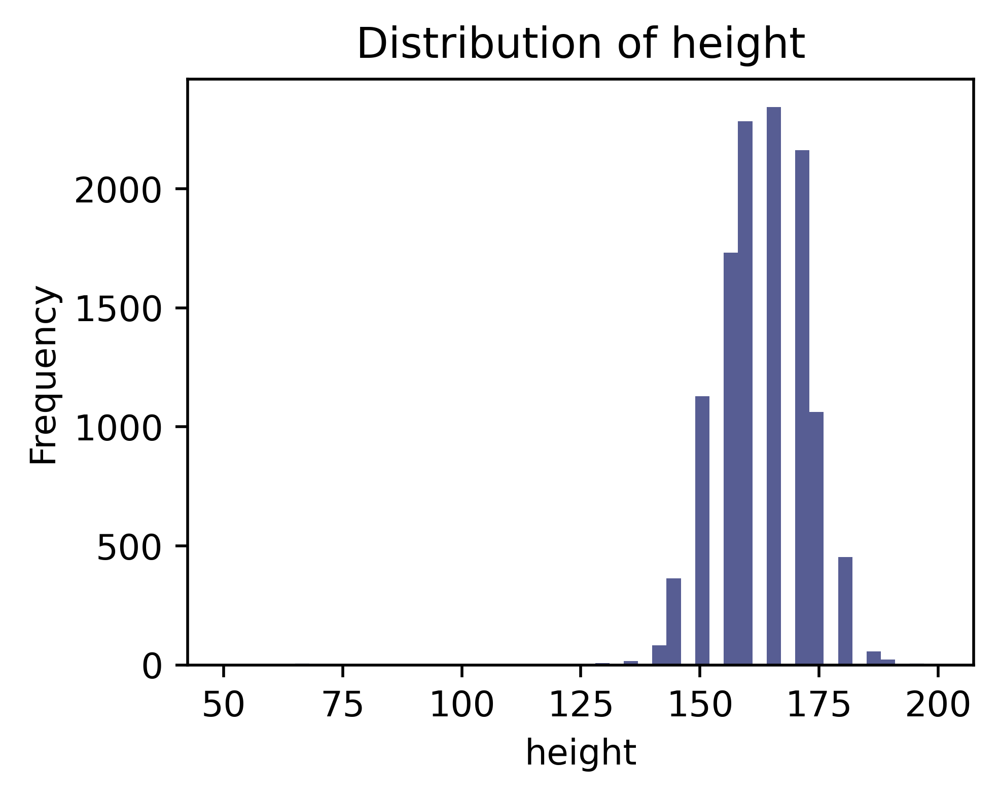

weight: min = 20.0, max = 175.0 


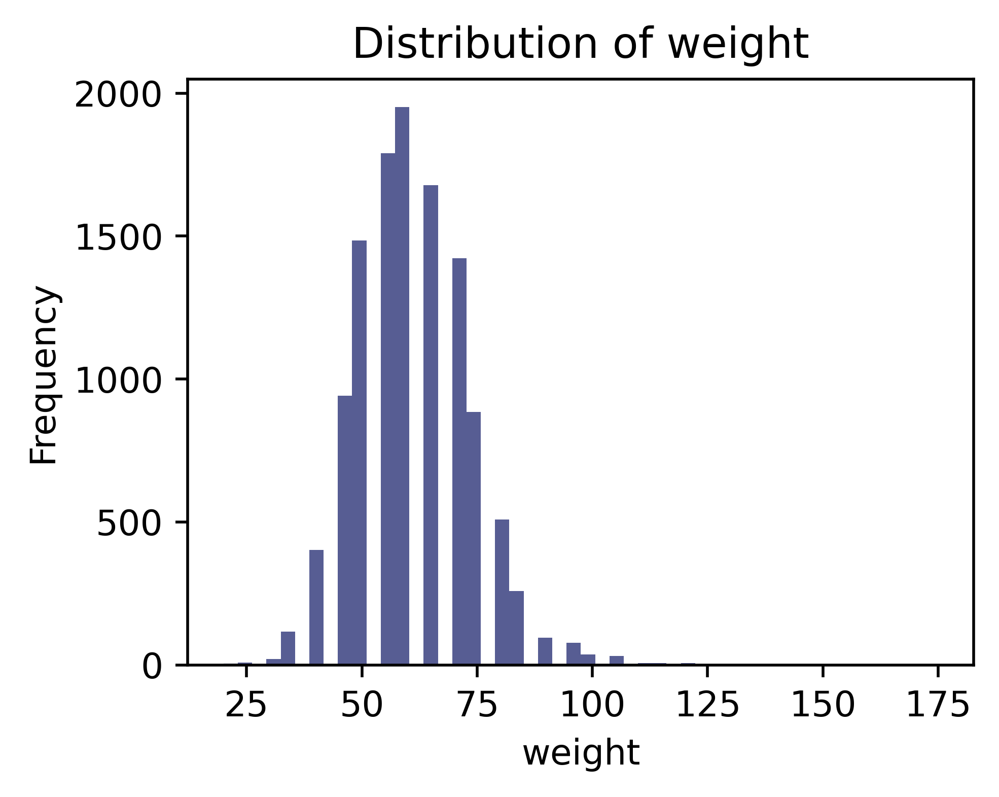

anstart_time: min = 5.0, max = 5133090.0 


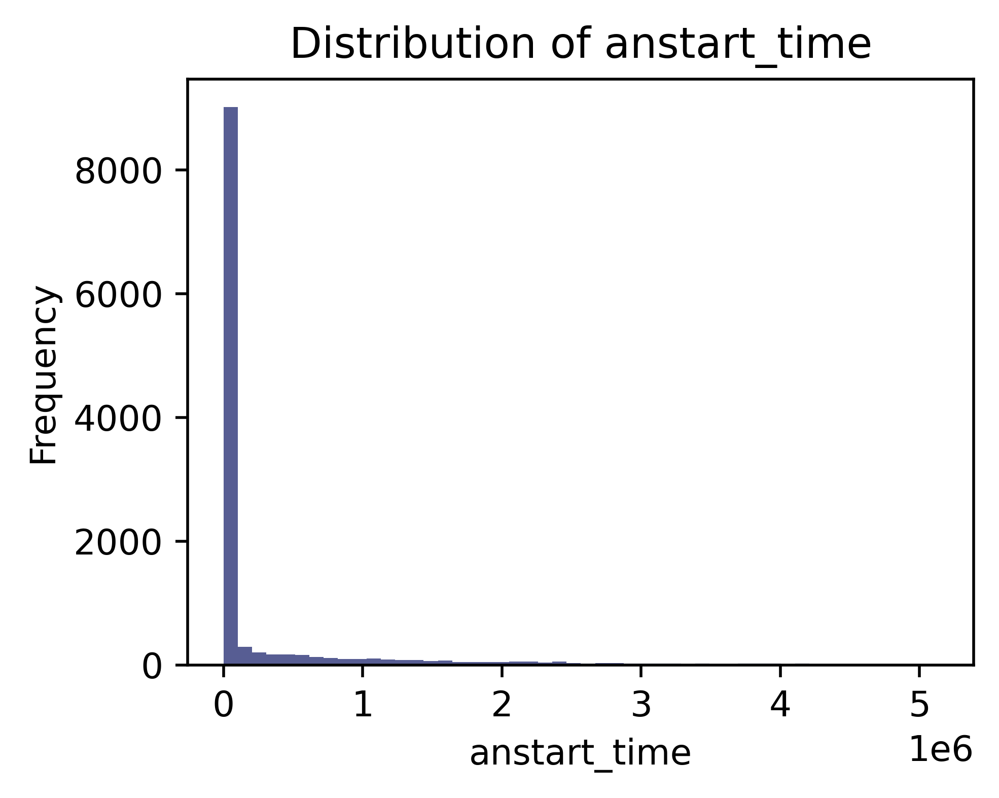

anend_time: min = 105.0, max = 5133570.0 


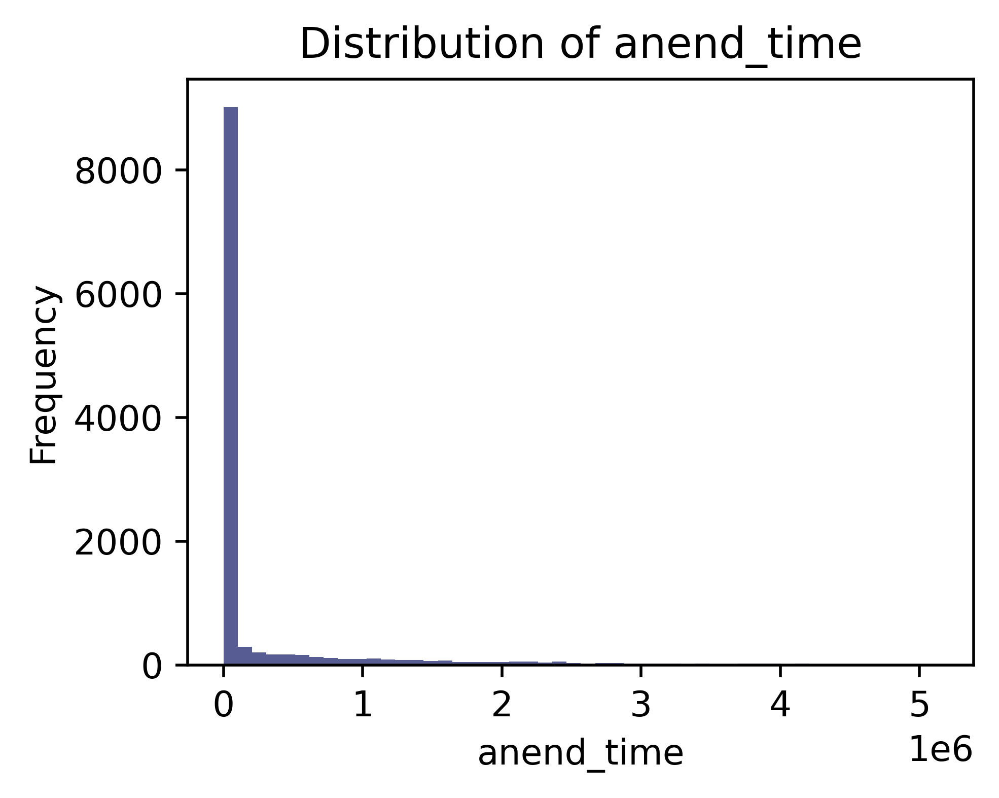

icd10_pcs: min = 00110, max = 10D00 


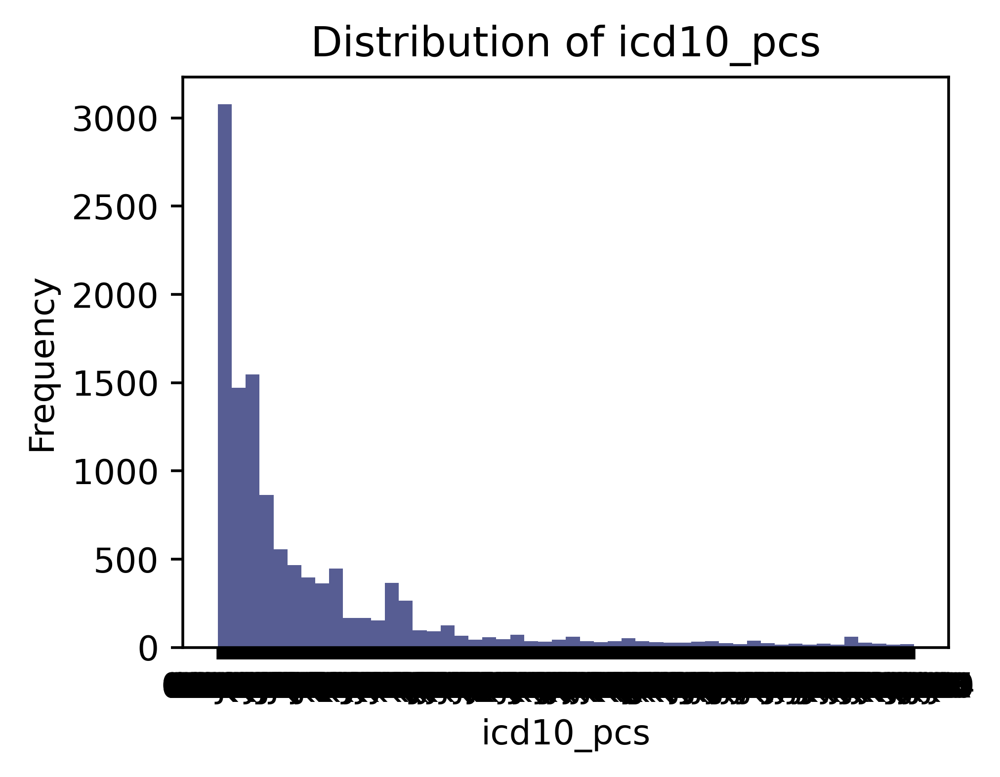

antype: min = General, max = Regional 


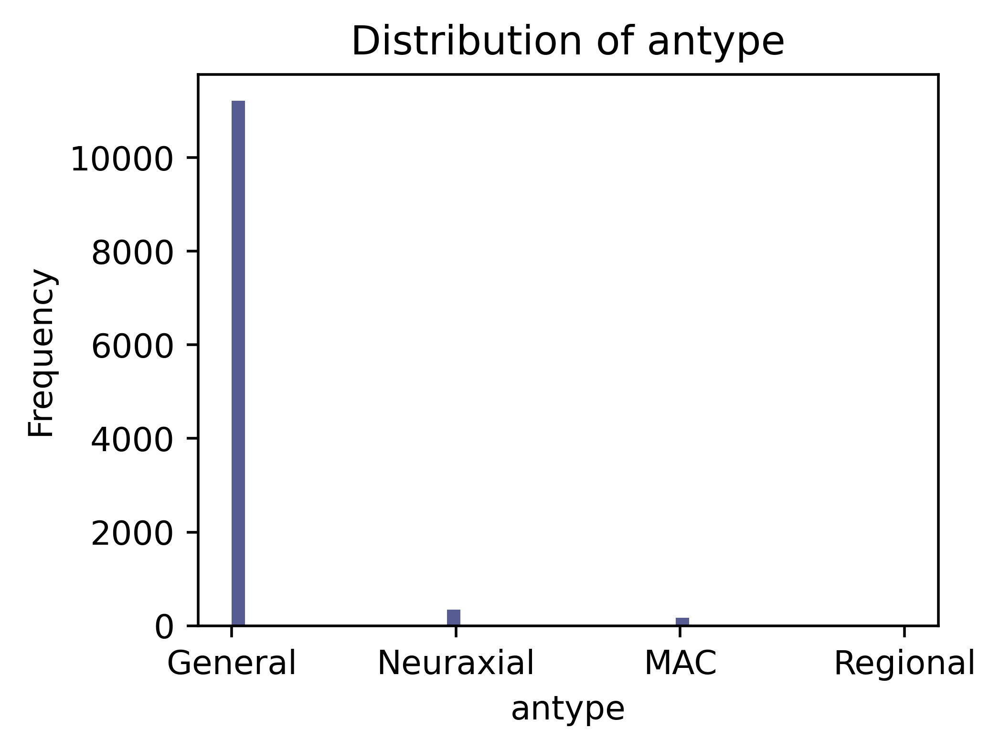

height_m: min = 0.5, max = 2.0 


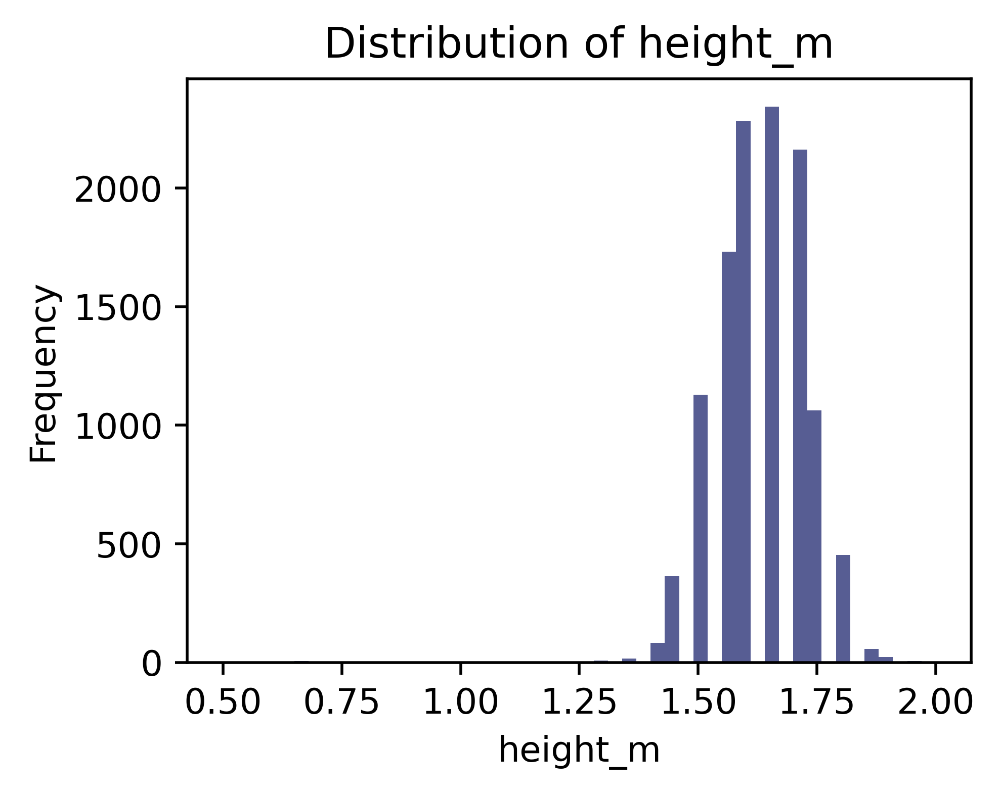

BMI: min = 10.802469135802468, max = 64.51612903225805 


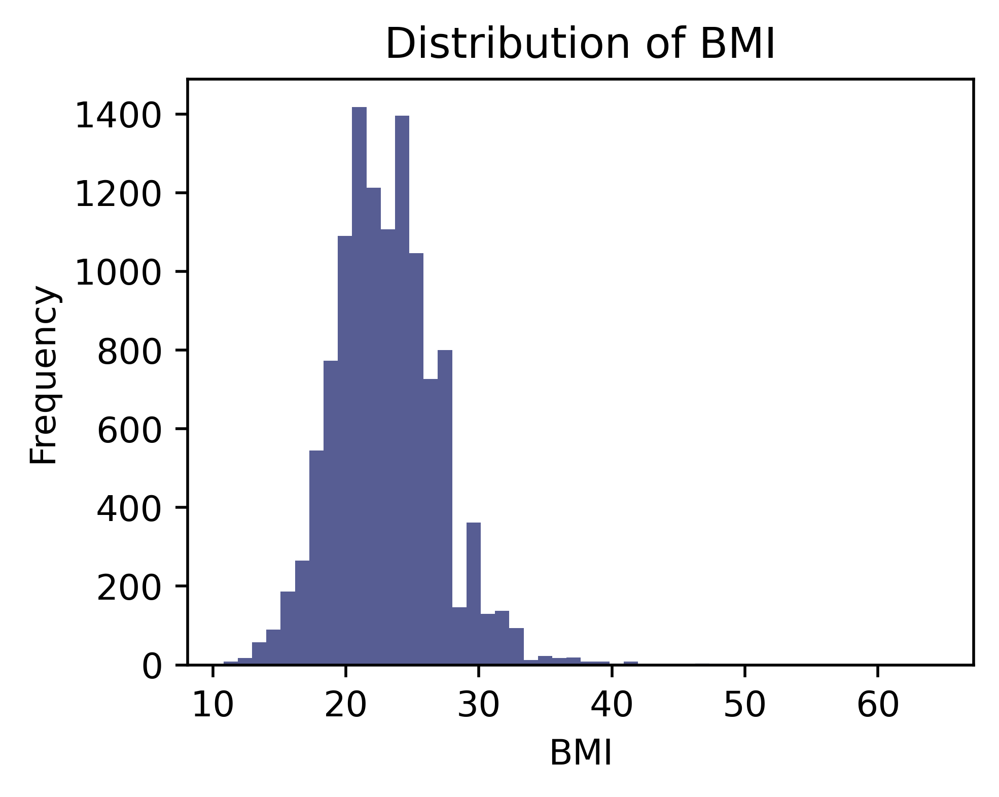

anesthesia_duration: min = 60.0, max = 1435.0 


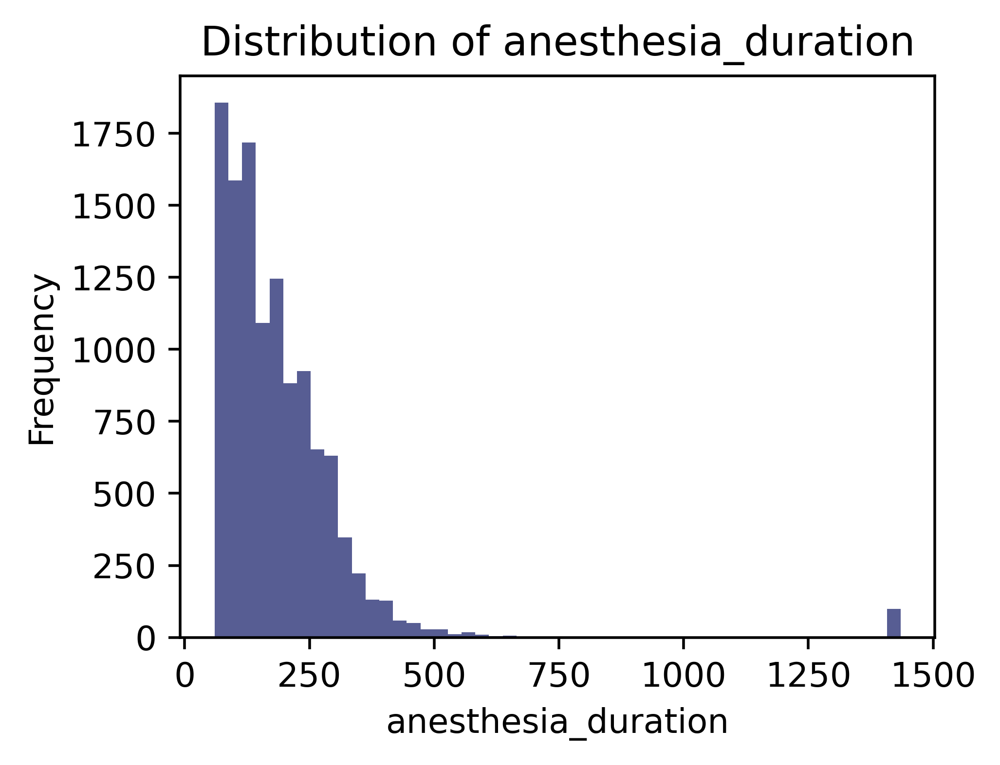

albumin: min = 2.3, max = 4.7 


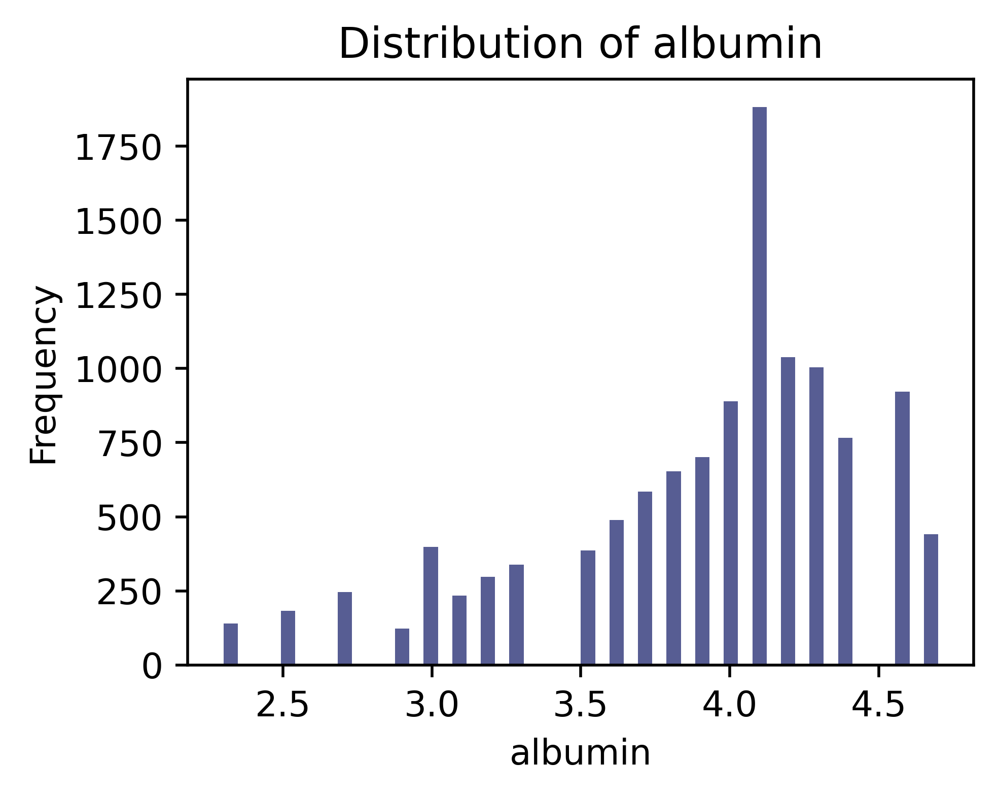

creatinine: min = 0.41, max = 5.55 


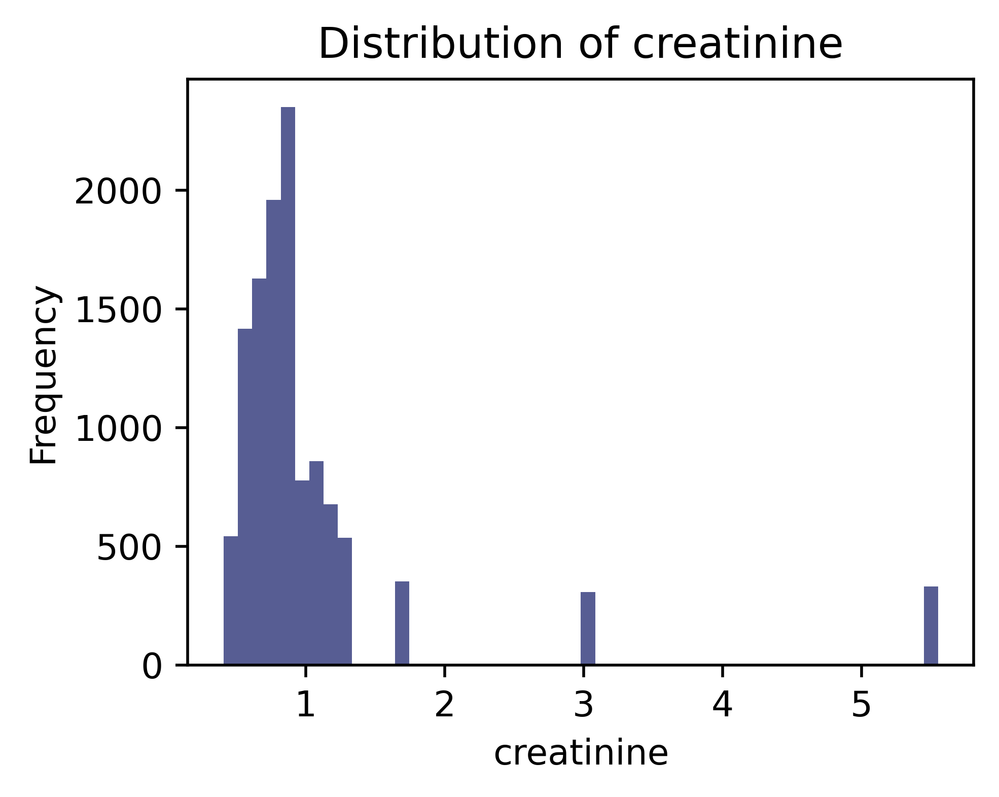

glucose: min = 78.0, max = 302.0 


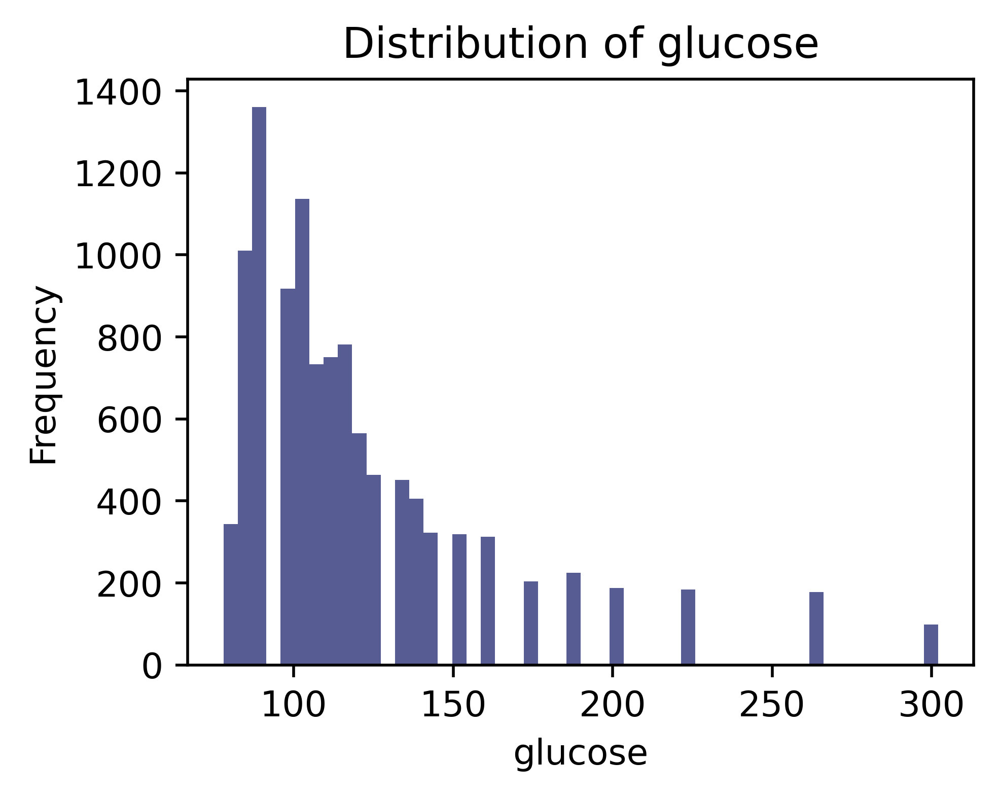

hco3: min = 16.6, max = 34.2 


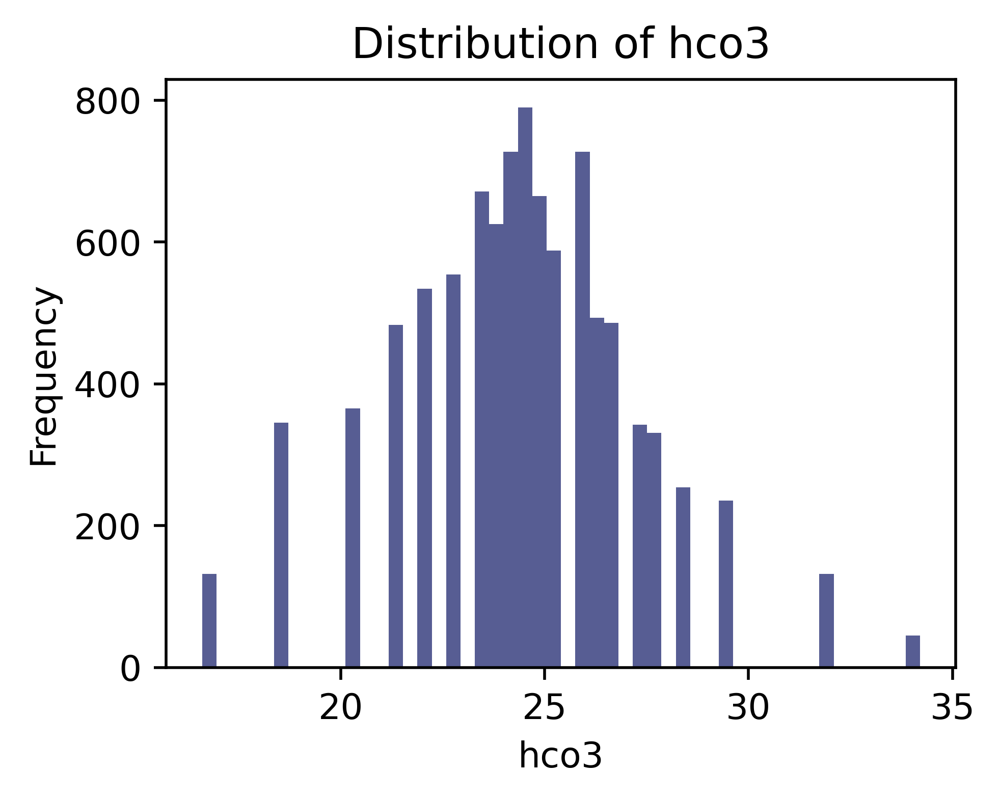

ptinr: min = 0.88, max = 2.56 


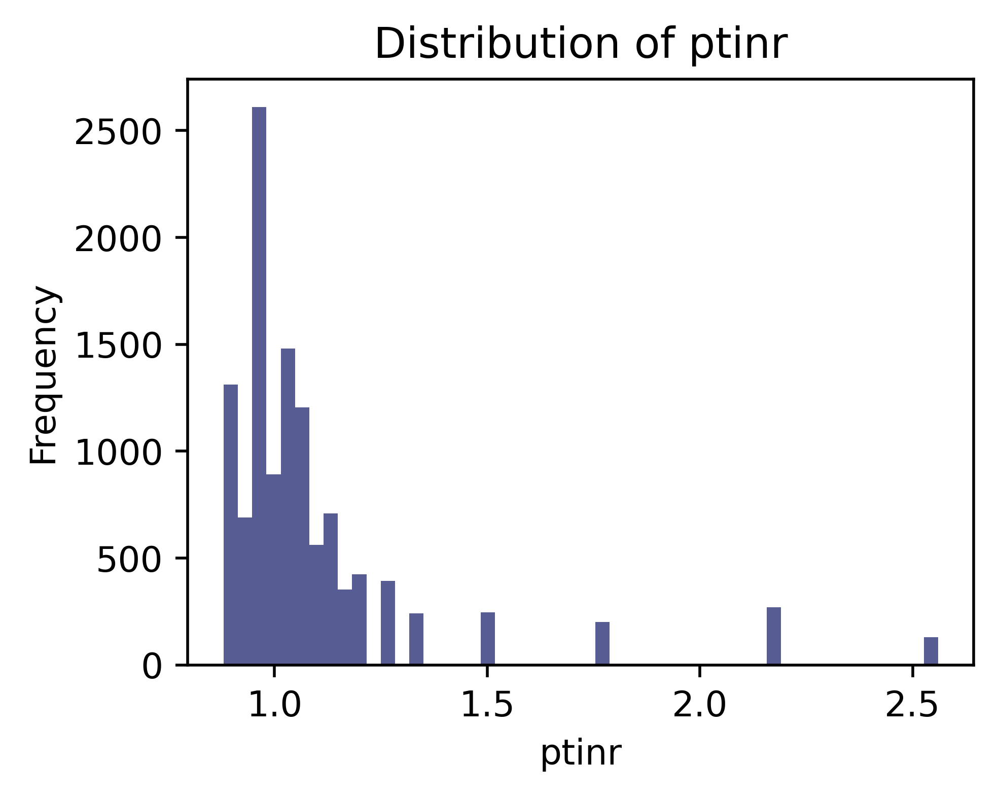

wbc: min = 2.63, max = 19.44 


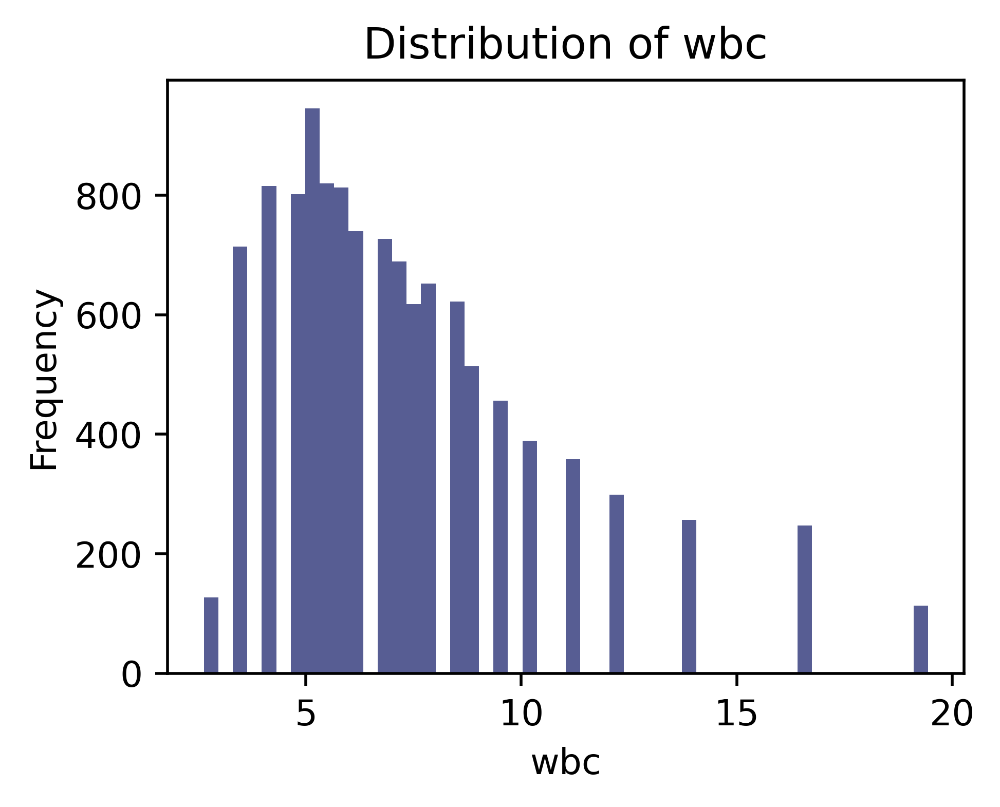

In [ ]:
for feat in operations_sub_with_labs.columns[2:]:
  print(f'{feat}: min = {np.min(operations_sub_with_labs[feat])}, max = {np.max(operations_sub_with_labs[feat])} ')
  plt.figure(figsize=(4,3), dpi=500)
  plt.hist(operations_sub_with_labs[feat], bins=50, alpha=0.9, color=palette['INSPIRE'])
  plt.xlabel(feat)
  plt.ylabel('Frequency')
  plt.title(f'Distribution of {feat}')
  plt.show()

In [ ]:
# Step 1: Merge operations_sub with ventilator data
vent_merge = pd.merge(
    operations_sub[['subject_id', 'anend_time']],
    ward_vitals.loc[ward_vitals['item_name'] == 'vent'],
    on='subject_id',
    how='inner'
)

# Step 2: Convert times to integers for comparison (if needed)
vent_merge['chart_time_sec'] = vent_merge['chart_time'].astype(int)
vent_merge['anend_time_sec'] = vent_merge['anend_time'].astype(int)

# Step 3: Keep only ventilator data from before end of anesthesia
pre_anend_vent = vent_merge[vent_merge['chart_time_sec'] < vent_merge['anend_time_sec']]

# Step 4: For each subject, we need to decide which ventilator value to use
# Let's take the most recent value before anesthesia end
pre_anend_vent = pre_anend_vent.sort_values(['subject_id', 'chart_time_sec'], ascending=[True, False])
selected_vent = pre_anend_vent.drop_duplicates('subject_id')

# Step 5: Create a Series with subject_id as index and value as values
vent_series = selected_vent.set_index('subject_id')['value']

# Step 6: Add the ventilator values to operations_sub_with_labs
operations_sub_with_labs['vent'] = operations_sub_with_labs['subject_id'].map(vent_series)

# Print diagnostic information
print(f"Number of patients with ventilator data: {len(selected_vent)}")
print(f"Updated DataFrame shape: {operations_sub_with_labs.shape}")

Number of patients with ventilator data: 2896
Updated DataFrame shape: (11745, 19)


In [ ]:
df = operations_sub_with_labs[['age','BMI','anesthesia_duration','wbc','ptinr','glucose','creatinine','albumin','hco3','vent']]

In [ ]:
non_nan_count = df['vent'].count()
non_nan_count

5931

In [ ]:
df_no_nans = df[df['vent'].notna()]
df_no_nans

,age,BMI,anesthesia_duration,wbc,ptinr,glucose,creatinine,albumin,hco3,vent
0,70,15.570934,115.0,4.24,1.00,120.0,0.98,4.7,22.2,1.0
8,55,20.811655,190.0,8.38,1.09,91.0,0.61,4.1,25.0,0.0
9,70,14.693878,110.0,4.24,1.00,120.0,0.98,4.7,22.2,1.0
11,65,21.484375,120.0,7.90,1.03,225.0,1.69,3.5,20.4,0.0
16,70,27.755102,355.0,6.67,1.07,115.0,0.84,4.0,25.8,0.0
...,...,...,...,...,...,...,...,...,...,...
11740,40,16.528926,65.0,8.90,1.07,96.0,0.84,4.0,24.2,0.0
11741,75,24.444444,255.0,5.94,1.76,105.0,1.33,4.3,25.8,0.0
11742,65,20.811655,245.0,2.63,1.76,91.0,0.84,3.7,24.2,0.0
11743,80,22.222222,145.0,4.24,0.90,110.0,0.58,4.3,27.2,0.0


In [ ]:
df_no_nans.to_csv('INSPIRE_8feat.csv')

In [ ]:
X = df_no_nans.drop(['vent'], axis=1)
y = df_no_nans['vent']

In [ ]:
# Function to evaluate model performance
def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
    # Fit model
    model.fit(X_train, y_train)

    # Get predictions
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Calculate metrics
    auroc = roc_auc_score(y_test, y_pred_proba)
    auprc = average_precision_score(y_test, y_pred_proba)

    # Store results
    global results  # Access the global results dictionary
    results[model_name] = {
        'model': model,
        'auroc': auroc,
        'auprc': auprc
    }

    print(f"{model_name} - AUROC: {auroc:.4f}, AUPRC: {auprc:.4f}")

    return model

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, average_precision_score, roc_curve, precision_recall_curve
from sklearn.inspection import permutation_importance
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

# Import FasterRisk if you're using it
from fasterrisk.fasterrisk import RiskScoreOptimizer, RiskScoreClassifier

# Function to convert 0/1 labels to -1/+1 for FasterRisk
def convert_labels_for_fasterrisk(y):
    y_np = y.values if hasattr(y, 'values') else np.array(y)
    return 2 * y_np - 1

In [ ]:
# Check data shape and handle missing values
print("Original data shape:", X.shape)
print("Number of missing values per column:")
print(X.isna().sum())

# Imputation (using KNN)
knn_imputer = KNNImputer(n_neighbors=5)
X_imputed_knn = pd.DataFrame(knn_imputer.fit_transform(X), columns=X.columns)
X = X_imputed_knn
print("\nAfter imputation - remaining missing values:", X.isna().sum().sum())

# Scale features for better model performance
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X = X_scaled  # Use scaled features

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Dictionary to store results
results = {}

# Create plots directory if it doesn't exist
import os
plots_dir = 'plots_dir'
if not os.path.exists(plots_dir):
    os.makedirs(plots_dir)

# 1. Decision Tree
dt_model = evaluate_model(
    DecisionTreeClassifier(max_depth=4, random_state=42),
    X_train, X_test, y_train, y_test,
    "Decision Tree"
)

# 2. Random Forest
rf_model = evaluate_model(
    RandomForestClassifier(n_estimators=100, max_depth=4, random_state=42),
    X_train, X_test, y_train, y_test,
    "Random Forest"
)

# 3. Logistic Regression
lr_model = evaluate_model(
    LogisticRegression(max_iter=1000, C=1.0, random_state=42),
    X_train, X_test, y_train, y_test,
    "Logistic Regression"
)

# 4. Gradient Boosting
gb_model = evaluate_model(
    GradientBoostingClassifier(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42),
    X_train, X_test, y_train, y_test,
    "Gradient Boosting"
)

Original data shape: (5931, 9)
Number of missing values per column:
age                      0
BMI                     18
anesthesia_duration      0
wbc                      3
ptinr                    1
glucose                125
creatinine               1
albumin                  1
hco3                   163
dtype: int64

After imputation - remaining missing values: 0
Decision Tree - AUROC: 0.6264, AUPRC: 0.2628
Random Forest - AUROC: 0.7281, AUPRC: 0.3723
Logistic Regression - AUROC: 0.6683, AUPRC: 0.2986
Gradient Boosting - AUROC: 0.7518, AUPRC: 0.4266


In [ ]:
# ----- FasterRisk Implementation -----
# Convert labels
y_train_fr = convert_labels_for_fasterrisk(y_train)
y_test_fr = convert_labels_for_fasterrisk(y_test)

# Define parent_size
parent_size = 10  # Beam search parameter

# Original FasterRisk with 5 features
print("\n----- Training FasterRisk Model (Original - 5 features) -----")
original_sparsity = 5  # Number of features to use in risk score

risk_score_optimizer = RiskScoreOptimizer(X=X_train.values,
                                         y=y_train_fr,
                                         k=original_sparsity,
                                         parent_size=parent_size)


start_time = time.time()
risk_score_optimizer.optimize()
end_time = time.time()
print(f"FasterRisk optimization completed in {end_time - start_time:.2f} seconds")

# Get the optimized models
multipliers, intercepts, coefficients = risk_score_optimizer.get_models()

# Use the first model (best performing)
model_index = 0
multiplier = multipliers[model_index]
intercept = intercepts[model_index]
coefficient = coefficients[model_index]

# Create FasterRisk classifier
risk_classifier = RiskScoreClassifier(multiplier=multiplier,
                                     intercept=intercept,
                                     coefficients=coefficient,
                                     featureNames=list(X.columns),
                                     X_train=X_train.values)

# Print the model card
print("\nFasterRisk Model Card:")
risk_classifier.print_model_card()

# Create a wrapper for sklearn-compatible API
class FasterRiskWrapper:
    def __init__(self, risk_classifier):
        self.risk_classifier = risk_classifier

    def predict(self, X):
        return self.risk_classifier.predict(X=X)

    def predict_proba(self, X):
        # Get probabilities using predict_prob
        probs = self.risk_classifier.predict_prob(X=X)
        # Return in sklearn-like format
        return np.vstack((1 - probs, probs)).T

# Wrap the classifier and evaluate
risk_classifier_wrapped = FasterRiskWrapper(risk_classifier)

# Evaluate FasterRisk
y_test_prob_fr = risk_classifier.predict_prob(X=X_test.values)
test_auroc = roc_auc_score(y_test, y_test_prob_fr)
test_auprc = average_precision_score(y_test, y_test_prob_fr)

# Get accuracy and AUC directly from the model
model_acc_test, model_auc_test = risk_classifier.get_acc_and_auc(X=X_test.values, y=y_test_fr)

# Add to results
results["FasterRisk"] = {
    'model': risk_classifier_wrapped,
    'auroc': test_auroc,
    'auprc': test_auprc,
    'features_used': sum(np.array(coefficient) != 0),
    'coefficients': coefficient
}

print(f"FasterRisk - AUROC: {test_auroc:.4f}, AUPRC: {test_auprc:.4f}")


----- Training FasterRisk Model (Original - 5 features) -----
FasterRisk optimization completed in 1.52 seconds

FasterRisk Model Card:
The Risk Score is:
1.                 BMI     -3 point(s) |   ...
2. anesthesia_duration      1 point(s) | + ...
3.                 wbc      2 point(s) | + ...
4.             glucose      1 point(s) | + ...
5.             albumin     -2 point(s) | + ...
                                 SCORE | =    
SCORE |  -5.0  |  -4.0  |  -3.0  |  -2.0  |  -1.0  |
RISK  |   9.1% |  10.2% |  11.3% |  12.6% |  14.0% |
SCORE |   0.0  |   1.0  |   2.0  |   3.0  |   4.0  |
RISK  |  15.5% |  17.2% |  19.0% |  20.9% |  23.0% |
FasterRisk - AUROC: 0.6648, AUPRC: 0.2926


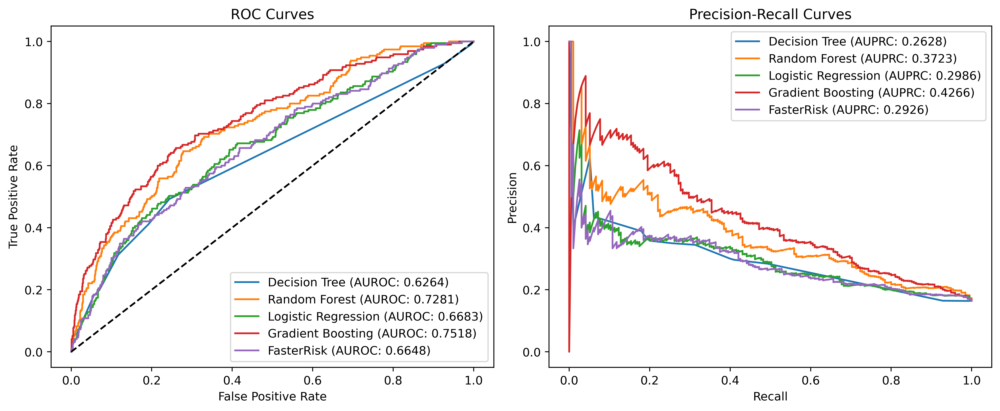

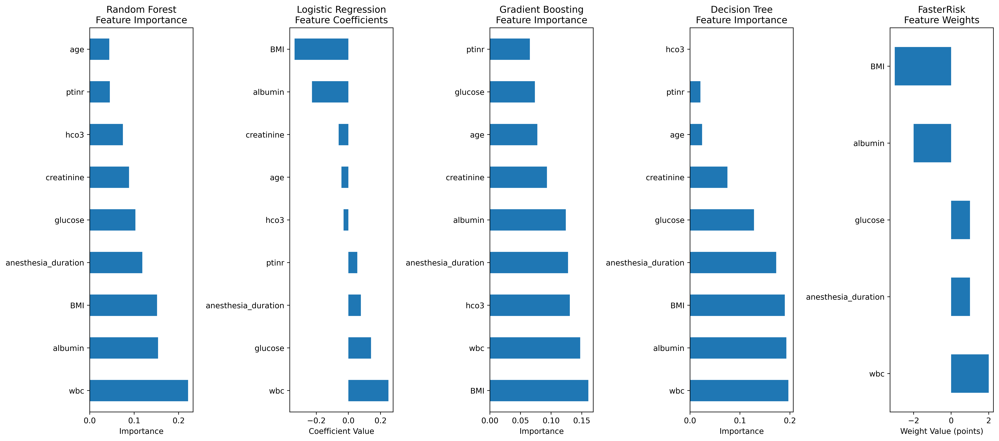

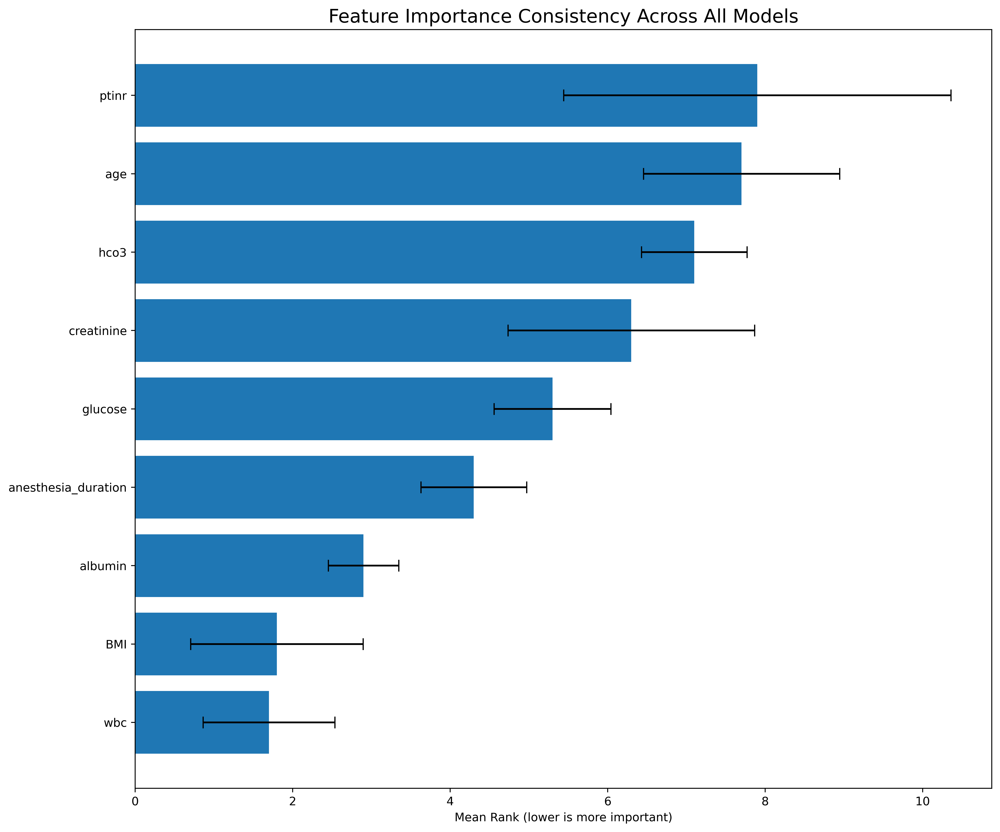


Model Performance Comparison:
Decision Tree:
  AUROC: 0.6264
  AUPRC: 0.2628
Random Forest:
  AUROC: 0.7281
  AUPRC: 0.3723
Logistic Regression:
  AUROC: 0.6683
  AUPRC: 0.2986
Gradient Boosting:
  AUROC: 0.7518
  AUPRC: 0.4266
FasterRisk:
  AUROC: 0.6648
  AUPRC: 0.2926

Top 5 Most Consistently Important Features:
- wbc
- BMI
- albumin
- anesthesia_duration
- glucose

----- FasterRisk Model Interpretation -----
Risk Score Points:
  BMI: -3.0 point(s)
  anesthesia_duration: 1.0 point(s)
  wbc: 2.0 point(s)
  glucose: 1.0 point(s)
  albumin: -2.0 point(s)
Intercept: -14.0


In [ ]:
# Plot ROC curves for all models
plt.figure(figsize=(12, 5), dpi=500)

plt.subplot(1, 2, 1)
for model_name in results:
    if model_name == "FasterRisk":
        y_pred_proba = results[model_name]['model'].predict_proba(X_test.values)[:, 1]
    else:
        y_pred_proba = results[model_name]['model'].predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, label=f"{model_name} (AUROC: {results[model_name]['auroc']:.4f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend()

# Plot PR curves
plt.subplot(1, 2, 2)
for model_name in results:
    if model_name == "FasterRisk":
        y_pred_proba = results[model_name]['model'].predict_proba(X_test.values)[:, 1]
    else:
        y_pred_proba = results[model_name]['model'].predict_proba(X_test)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    plt.plot(recall, precision, label=f"{model_name} (AUPRC: {results[model_name]['auprc']:.4f})")

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, 'model_comparison_curves.png'))
plt.show()

# Feature importance for all models
all_importances = pd.DataFrame(index=X.columns)

# 1. Decision Tree Feature Importance
dt_importances = pd.Series(dt_model.feature_importances_, index=X.columns)
all_importances['Decision Tree'] = dt_importances

# 2. Random Forest Feature Importance
rf_importances = pd.Series(rf_model.feature_importances_, index=X.columns)
all_importances['Random Forest'] = rf_importances

# 3. Logistic Regression Coefficients
lr_importances = pd.Series(np.abs(lr_model.coef_[0]), index=X.columns)
all_importances['Logistic Regression'] = lr_importances

# Store original LR coefficients with sign for direction interpretation
lr_coef = pd.Series(lr_model.coef_[0], index=X.columns)

# 4. Gradient Boosting Feature Importance
gb_importances = pd.Series(gb_model.feature_importances_, index=X.columns)
all_importances['Gradient Boosting'] = gb_importances

# 5. FasterRisk Feature Importance (based on absolute coefficient values)
fr_importances = pd.Series(np.abs(coefficient), index=X.columns)
all_importances['FasterRisk'] = fr_importances

# Feature importance visualization
plt.figure(figsize=(18, 8), dpi=500)

# 1. Random Forest Feature Importance
plt.subplot(1, 5, 1)
rf_importances.sort_values(ascending=False).head(10).plot(kind='barh')
plt.title('Random Forest\nFeature Importance', fontsize=12)
plt.xlabel('Importance')

# 2. Logistic Regression Coefficients (with direction)
plt.subplot(1, 5, 2)
lr_coef.sort_values(ascending=False).head(10).plot(kind='barh')
plt.title('Logistic Regression\nFeature Coefficients', fontsize=12)
plt.xlabel('Coefficient Value')

# 3. Gradient Boosting Feature Importance
plt.subplot(1, 5, 3)
gb_importances.sort_values(ascending=False).head(10).plot(kind='barh')
plt.title('Gradient Boosting\nFeature Importance', fontsize=12)
plt.xlabel('Importance')

# 4. Decision Tree Feature Importance
plt.subplot(1, 5, 4)
dt_importances.sort_values(ascending=False).head(10).plot(kind='barh')
plt.title('Decision Tree\nFeature Importance', fontsize=12)
plt.xlabel('Importance')

# 5. FasterRisk Feature Importance (with sign)
plt.subplot(1, 5, 5)
fr_coef = pd.Series(coefficient, index=X.columns)
fr_coef[fr_coef != 0].sort_values(ascending=False).plot(kind='barh')
plt.title('FasterRisk\nFeature Weights', fontsize=12)
plt.xlabel('Weight Value (points)')

plt.tight_layout()
plt.savefig(os.path.join(plots_dir, 'feature_importance_comparison.png'))
plt.show()

# Create a feature importance consistency plot
mean_ranks = all_importances.rank(ascending=False).mean(axis=1).sort_values()
std_ranks = all_importances.rank(ascending=False).std(axis=1)

plt.figure(figsize=(12, 10), dpi=500)
plt.barh(mean_ranks.index, mean_ranks, xerr=std_ranks, capsize=5)
plt.xlabel('Mean Rank (lower is more important)')
plt.title('Feature Importance Consistency Across All Models', fontsize=16)
plt.tight_layout()
plt.savefig(os.path.join(plots_dir, 'feature_importance_consistency.png'))
plt.show()

# Print model performance comparison
print("\nModel Performance Comparison:")
for model_name in results:
    print(f"{model_name}:")
    print(f"  AUROC: {results[model_name]['auroc']:.4f}")
    print(f"  AUPRC: {results[model_name]['auprc']:.4f}")

# Print top 5 consistent important features
print("\nTop 5 Most Consistently Important Features:")
top_features = list(mean_ranks.head(5).index)
for feature in top_features:
    print(f"- {feature}")

# Print FasterRisk model interpretation
print("\n----- FasterRisk Model Interpretation -----")
print("Risk Score Points:")
for i, (feature, coef) in enumerate(zip(X.columns, coefficient)):
    if coef != 0:
        print(f"  {feature}: {coef} point(s)")
print(f"Intercept: {intercept}")

In [ ]:
# Function to calculate node-wise AUC
def calculate_node_auc(tree, node_id, X, y):
    """Calculate AUC if we stop at a specific node"""
    if tree.children_left[node_id] == tree.children_right[node_id]:  # leaf node
        return roc_auc_score(y, np.full(len(y), tree.value[node_id][0][1] / sum(tree.value[node_id][0])))

    # For non-leaf nodes, we need the feature and threshold
    feature = tree.feature[node_id]
    threshold = tree.threshold[node_id]

    # Make predictions based on this single split
    y_pred = (X[:, feature] > threshold).astype(int)

    # If the left child has more positive samples, invert the predictions
    left_ratio = tree.value[tree.children_left[node_id]][0][1] / sum(tree.value[tree.children_left[node_id]][0])
    right_ratio = tree.value[tree.children_right[node_id]][0][1] / sum(tree.value[tree.children_right[node_id]][0])

    if left_ratio > right_ratio:
        y_pred = 1 - y_pred

    # Calculate AUC
    try:
        return roc_auc_score(y, y_pred)
    except:
        return 0.5  # Default if AUC can't be calculated

def plot_decision_tree_with_metrics(tree_model, feature_names, class_names, X, y, filename=None):
    """Plot decision tree with confidence, samples and AUC at each node"""
    from sklearn import tree as sktree
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.colors as mcolors
    from matplotlib.colors import to_hex
    import tempfile
    import os

    # Get the underlying tree structure
    tree = tree_model.tree_

    # Function to calculate AUC for a node
    def calculate_node_auc(X, y, feature_idx, threshold, direction='left'):
        """Calculate AUC if using just this one split"""
        if feature_idx < 0:  # Leaf node
            return 0.5  # No split, so AUC is 0.5

        # Make predictions based on this single split
        if direction == 'left':
            y_pred = (X[:, feature_idx] <= threshold).astype(float)
        else:
            y_pred = (X[:, feature_idx] > threshold).astype(float)

        try:
            from sklearn.metrics import roc_auc_score
            return roc_auc_score(y, y_pred)
        except:
            return 0.5  # If AUC can't be calculated

    # Prepare figure
    plt.figure(figsize=(30,10), dpi=500)

    # Convert data to numpy if it's a DataFrame
    X_array = X.values if hasattr(X, 'values') else X
    y_array = y.values if hasattr(y, 'values') else y

    # Get decision path for all training instances
    node_indicator = tree_model.decision_path(X_array)

    # Get leaf nodes for each sample
    leaf_id = tree_model.apply(X_array)

    # Calculate samples per node
    n_nodes = tree.node_count
    n_samples_per_node = np.zeros(n_nodes, dtype=np.int64)
    for sample_id in range(X_array.shape[0]):
        # Find the nodes the sample goes through
        node_indices = node_indicator.indices[
            node_indicator.indptr[sample_id]:node_indicator.indptr[sample_id+1]
        ]
        # Add 1 to the count of samples for each of these nodes
        n_samples_per_node[node_indices] += 1

    # Visualize tree recursively
    def visualize_tree(node_id, depth, x, width):
        if node_id == -1:  # Invalid node
            return

        # Get node details
        is_leaf = tree.children_left[node_id] == -1

        if is_leaf:
            # Get the majority class and its confidence
            value = tree.value[node_id][0]
            total = np.sum(value)
            probs = value / total if total > 0 else np.zeros_like(value)
            majority_class = np.argmax(probs)
            confidence = probs[majority_class]

            # Color based on confidence (red for 0.5, green for 1.0)
            color_val = 2 * confidence - 1 if confidence >= 0.5 else 0
            box_color = mcolors.to_rgba(plt.cm.RdYlGn(color_val))

            # Create label for leaf node
            n_samples = n_samples_per_node[node_id]
            class_name = class_names[majority_class] if majority_class < len(class_names) else f"Class {majority_class}"
            label = f"Leaf Node\nSamples: {n_samples}\nClass: {class_name}\nConfidence: {confidence:.2f}"

            # Calculate accuracy on this node
            node_samples = np.where(leaf_id == node_id)[0]
            if len(node_samples) > 0:
                node_y = y_array[node_samples]
                node_pred = np.full(len(node_y), majority_class)
                accuracy = np.mean(node_y == node_pred)
                label += f"\nAccuracy: {accuracy:.2f}"
        else:
            # Split node
            feature = tree.feature[node_id]
            threshold = tree.threshold[node_id]

            # Calculate impurity and color
            impurity = tree.impurity[node_id]
            # Scale from 0 (pure) to 0.5 (maximum impurity for binary)
            color_val = 1.0 - 2 * impurity if impurity <= 0.5 else 0
            box_color = mcolors.to_rgba(plt.cm.RdYlGn(color_val))

            # Calculate AUC for this split
            left_auc = calculate_node_auc(X_array, y_array, feature, threshold, 'left')
            right_auc = calculate_node_auc(X_array, y_array, feature, threshold, 'right')
            split_auc = max(left_auc, right_auc)

            # Create label for decision node
            feature_name = feature_names[feature] if feature < len(feature_names) else f"feature {feature}"
            n_samples = n_samples_per_node[node_id]
            label = f"Feature: {feature_name}\nThreshold: {threshold:.2f}\nSamples: {n_samples}\nGini: {impurity:.2f}\nAUC: {split_auc:.2f}"

        # Draw the node
        node_box = dict(boxstyle='round', facecolor=box_color, alpha=0.8)
        plt.text(x, -depth, label, bbox=node_box, ha='center', va='center', fontsize=10)

        # Draw child nodes and connections if not a leaf
        if not is_leaf:
            left_child = tree.children_left[node_id]
            right_child = tree.children_right[node_id]

            # Draw left child
            left_x = x - width/2
            plt.plot([x, left_x], [-depth, -(depth+1)], 'k-')
            visualize_tree(left_child, depth+1, left_x, width/2)

            # Draw right child
            right_x = x + width/2
            plt.plot([x, right_x], [-depth, -(depth+1)], 'k-')
            visualize_tree(right_child, depth+1, right_x, width/2)

    # Start visualization from root node
    ax = plt.gca()
    ax.set_axis_off()
    visualize_tree(0, 0, 0, 2.0)

    # Set plot limits based on tree depth
    max_depth = tree_model.get_depth()
    plt.title('Decision Tree with Confidence, Samples and AUC', fontsize=16)
    plt.xlim(-2, 2)
    plt.ylim(-(max_depth+1), 1)

    # Add color legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor=mcolors.to_rgba(plt.cm.RdYlGn(0)), label='Low Confidence / High Impurity'),
        Patch(facecolor=mcolors.to_rgba(plt.cm.RdYlGn(0.5)), label='Medium'),
        Patch(facecolor=mcolors.to_rgba(plt.cm.RdYlGn(1)), label='High Confidence / Low Impurity')
    ]
    plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=3)

    plt.tight_layout()

    # Save the figure if filename is provided
    if filename:
        plt.savefig(filename, bbox_inches='tight', dpi=300)
        print(f"Decision tree visualization saved to {filename}")

    plt.show()

    # For smaller trees, also use export_graphviz for an alternative view
    if tree_model.get_depth() <= 5:
        try:
            from sklearn.tree import export_graphviz
            import graphviz

            dot_file = os.path.join(os.path.dirname(filename), 'tree_graphviz.dot')
            pdf_file = os.path.join(os.path.dirname(filename), 'tree_graphviz.pdf')

            export_graphviz(
                tree_model,
                out_file=dot_file,
                feature_names=feature_names,
                class_names=class_names,
                filled=True,
                rounded=True,
                special_characters=True,
                proportion=True
            )

            # Convert to PDF
            try:
                graph = graphviz.Source.from_file(dot_file)
                graph.render(pdf_file.replace('.pdf', ''), format='pdf', cleanup=True)
                print(f"Alternative tree visualization saved to {pdf_file}")
            except:
                print("Could not generate graphviz PDF (graphviz may not be installed)")
        except:
                print("Could not generate alternative tree visualization")

    return None

In [ ]:
###############################################################################
# ADDITION 1: Decision Tree Visualization with Confidence and AUC
###############################################################################

print("\n----- ADDITION 1: Decision Tree Visualization with Confidence and AUC -----")

# Use the existing decision tree model for visualization instead of creating a new one
print("Using the existing decision tree model for visualization")
graph = plot_decision_tree_with_metrics(
    dt_model,  # Use the existing model instead of creating a new one
    X.columns,
    ['Negative', 'Positive'],
    X_train,
    y_train,
    os.path.join(plots_dir, 'decision_tree_with_metrics.png')
)
print("Decision tree visualization completed successfully")


----- ADDITION 1: Decision Tree Visualization with Confidence and AUC -----
Using the existing decision tree model for visualization


/Users/hhieromnimon/opt/miniconda3/envs/py39/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/Users/hhieromnimon/opt/miniconda3/envs/py39/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


Decision tree visualization saved to plots_dir/decision_tree_with_metrics.png


Could not generate graphviz PDF (graphviz may not be installed)
Decision tree visualization completed successfully



----- ADDITION 2: Random Forest with Top Important Features -----
Top 5 features from Random Forest: ['wbc', 'albumin', 'BMI', 'anesthesia_duration', 'glucose']

Training Random Forest with top 2 features: ['wbc', 'albumin']
RF with top 2 features - AUROC: 0.6339, AUPRC: 0.2850

Training Random Forest with top 3 features: ['wbc', 'albumin', 'BMI']
RF with top 3 features - AUROC: 0.6660, AUPRC: 0.3298

Training Random Forest with top 4 features: ['wbc', 'albumin', 'BMI', 'anesthesia_duration']
RF with top 4 features - AUROC: 0.6968, AUPRC: 0.3412

Training Random Forest with top 5 features: ['wbc', 'albumin', 'BMI', 'anesthesia_duration', 'glucose']
RF with top 5 features - AUROC: 0.7055, AUPRC: 0.3426


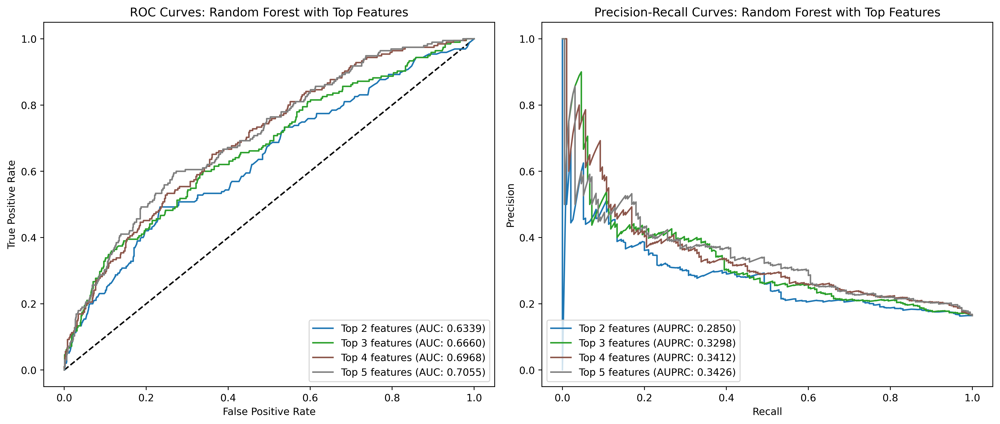

In [ ]:
###############################################################################
# ADDITION 2: Random Forest with Top Important Features Analysis
###############################################################################

print("\n----- ADDITION 2: Random Forest with Top Important Features -----")

# Get top 5 features from Random Forest importance
rf_top_features = rf_importances.sort_values(ascending=False).head(5).index.tolist()
print(f"Top 5 features from Random Forest: {rf_top_features}")

# Dictionary to track RF models with different feature subsets
rf_subset_results = {}

# Create a plot to compare performance
plt.figure(figsize=(14, 6), dpi=500)

# ROC Curves subplot
plt.subplot(1, 2, 1)
plt.plot([0, 1], [0, 1], 'k--')  # Random classifier line

# Precision-Recall Curves subplot
plt.subplot(1, 2, 2)

# Create a color cycle
colors = plt.cm.tab10(np.linspace(0, 1, 5))

# Train RF models with top 2, 3, 4, and 5 features
for i, n_features in enumerate(range(2, 6)):
    subset_features = rf_top_features[:n_features]
    print(f"\nTraining Random Forest with top {n_features} features: {subset_features}")

    # Subset the data
    X_train_subset = X_train[subset_features]
    X_test_subset = X_test[subset_features]

    # Train a Random Forest on this subset
    rf_subset = RandomForestClassifier(n_estimators=100, max_depth=4, random_state=42)
    rf_subset.fit(X_train_subset, y_train)

    # Evaluate performance
    y_pred_proba = rf_subset.predict_proba(X_test_subset)[:, 1]
    auroc = roc_auc_score(y_test, y_pred_proba)
    auprc = average_precision_score(y_test, y_pred_proba)

    # Store results
    rf_subset_results[f"RF-Top{n_features}"] = {
        'model': rf_subset,
        'features': subset_features,
        'auroc': auroc,
        'auprc': auprc
    }

    print(f"RF with top {n_features} features - AUROC: {auroc:.4f}, AUPRC: {auprc:.4f}")

    # Plot ROC curve
    plt.subplot(1, 2, 1)
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, color=colors[i], label=f"Top {n_features} features (AUC: {auroc:.4f})")

    # Plot PR curve
    plt.subplot(1, 2, 2)
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    plt.plot(recall, precision, color=colors[i], label=f"Top {n_features} features (AUPRC: {auprc:.4f})")

# Finalize ROC plot
plt.subplot(1, 2, 1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves: Random Forest with Top Features')
plt.legend(loc="lower right")

# Finalize PR plot
plt.subplot(1, 2, 2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves: Random Forest with Top Features')
plt.legend(loc="lower left")

plt.tight_layout()
plt.savefig(os.path.join(plots_dir, 'rf_top_features_comparison.png'))
plt.show()

NameError: name 'fr_subset_results' is not defined

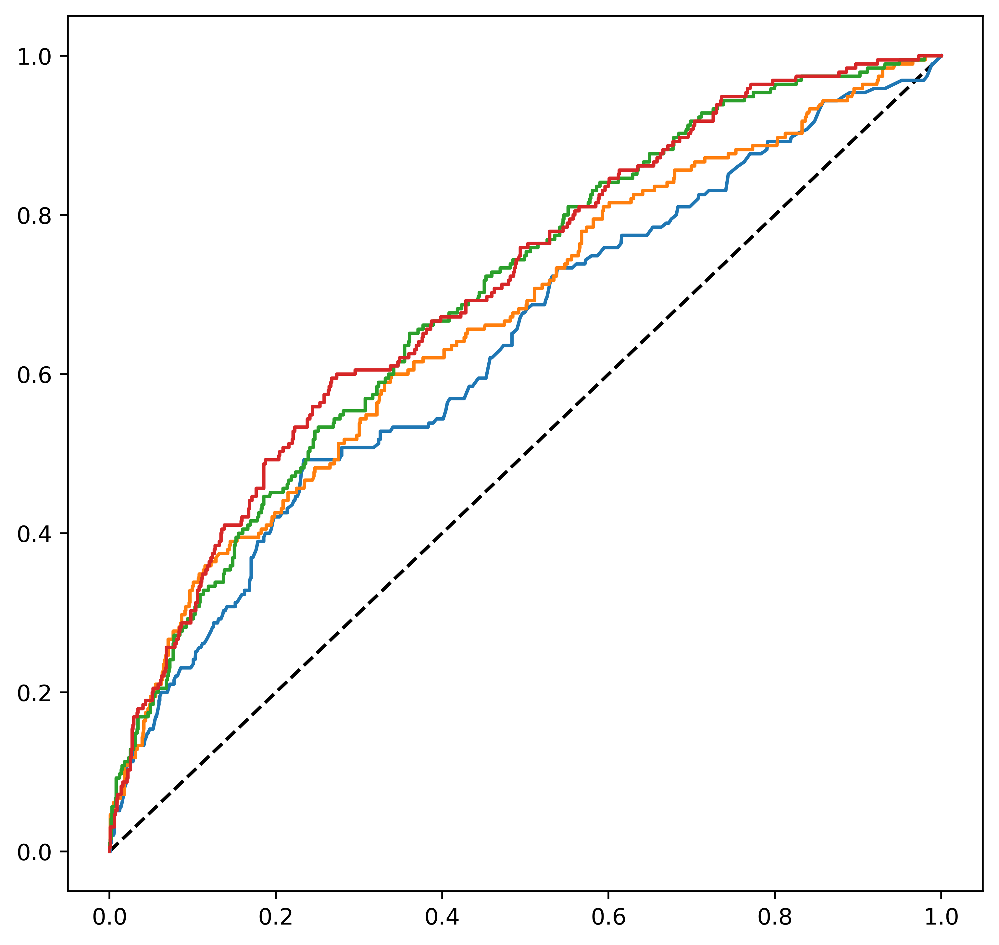

In [ ]:
# Compare RF with top features and FasterRisk with different sparsity levels
plt.figure(figsize=(16, 7), dpi=500)

# ROC Curves for both types of models
plt.subplot(1, 2, 1)
plt.plot([0, 1], [0, 1], 'k--')  # Random classifier line

# Plot Random Forest models
for model_name, model_info in rf_subset_results.items():
    n_features = len(model_info['features'])
    subset_features = model_info['features']
    y_pred_proba = model_info['model'].predict_proba(X_test[subset_features])[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, linestyle='-',
             label=f"RF: {n_features} features (AUC: {model_info['auroc']:.4f})")

# Plot FasterRisk models
for model_name, model_info in fr_subset_results.items():
    n_features = len(model_info['features'])
    if model_name == "FR-Top5":
        y_pred_proba = y_test_prob_fr
    else:
        risk_classifier_i = model_info['model'].risk_classifier
        y_pred_proba = risk_classifier_i.predict_prob(X=X_test.values)

    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, linestyle='--',
             label=f"FR: {n_features} features (AUC: {model_info['auroc']:.4f})")

# PR Curves
plt.subplot(1, 2, 2)

# Plot Random Forest models
for model_name, model_info in rf_subset_results.items():
    n_features = len(model_info['features'])
    subset_features = model_info['features']
    y_pred_proba = model_info['model'].predict_proba(X_test[subset_features])[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    plt.plot(recall, precision, linestyle='-',
             label=f"RF: {n_features} features (AUPRC: {model_info['auprc']:.4f})")

# Plot FasterRisk models
for model_name, model_info in fr_subset_results.items():
    n_features = len(model_info['features'])
    if model_name == "FR-Top5":
        y_pred_proba = y_test_prob_fr
    else:
        risk_classifier_i = model_info['model'].risk_classifier
        y_pred_proba = risk_classifier_i.predict_prob(X=X_test.values)

    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    plt.plot(recall, precision, linestyle='--',
             label=f"FR: {n_features} features (AUPRC: {model_info['auprc']:.4f})")

# Finalize ROC plot
plt.subplot(1, 2, 1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves: RF vs FasterRisk with Different Feature Counts')
plt.legend(loc="lower right")

# Finalize PR plot
plt.subplot(1, 2, 2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR Curves: RF vs FasterRisk with Different Feature Counts')
plt.legend(loc="lower left")

plt.tight_layout()
plt.savefig(os.path.join(plots_dir, 'rf_vs_fr_comparison.png'))
plt.show()

# Print combined comparison table
print("\nCombined Performance Comparison (RF vs FasterRisk):")
print("{:<15} {:<10} {:<10} {:<10}".format("Model", "Features", "AUROC", "AUPRC"))
print("-" * 45)

# RF Models
for model_name in sorted(rf_subset_results.keys()):
    model_info = rf_subset_results[model_name]
    n_features = len(model_info['features'])
    auroc = model_info['auroc']
    auprc = model_info['auprc']
    print("{:<15} {:<10d} {:<10.4f} {:<10.4f}".format(model_name, n_features, auroc, auprc))

# FasterRisk Models
for model_name in sorted(fr_subset_results.keys()):
    model_info = fr_subset_results[model_name]
    n_features = len(model_info['features'])
    auroc = model_info['auroc']
    auprc = model_info['auprc']
    print("{:<15} {:<10d} {:<10.4f} {:<10.4f}".format(model_name, n_features, auroc, auprc))

# Save combined comparison to CSV
combined_rows = []
for model_type, results_dict in [("RandomForest", rf_subset_results), ("FasterRisk", fr_subset_results)]:
    for model_name, model_info in results_dict.items():
        combined_rows.append({
            'Model': model_name,
            'Type': model_type,
            'Features_Count': len(model_info['features']),
            'Features': ', '.join(model_info['features']),
            'AUROC': model_info['auroc'],
            'AUPRC': model_info['auprc']
        })

combined_df = pd.DataFrame(combined_rows)
combined_df.to_csv(os.path.join(plots_dir, 'combined_model_comparison.csv'), index=False)
print(f"\nCombined model comparison saved to {os.path.join(plots_dir, 'combined_model_comparison.csv')}")

In [ ]:
# Compare RF with top features and FasterRisk with different sparsity levels
plt.figure(figsize=(16, 7), dpi=500)

# ROC Curves for both types of models
plt.subplot(1, 2, 1)
plt.plot([0, 1], [0, 1], 'k--')  # Random classifier line

# Plot Random Forest models
for model_name, model_info in rf_subset_results.items():
    n_features = len(model_info['features'])
    subset_features = model_info['features']
    y_pred_proba = model_info['model'].predict_proba(X_test[subset_features])[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, linestyle='-',
             label=f"RF: {n_features} features (AUC: {model_info['auroc']:.4f})")

# Plot FasterRisk models
for model_name, model_info in fr_subset_results.items():
    n_features = len(model_info['features'])
    if model_name == "FR-Top5":
        y_pred_proba = y_test_prob_fr
    else:
        risk_classifier_i = model_info['model'].risk_classifier
        y_pred_proba = risk_classifier_i.predict_prob(X=X_test.values)

    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, linestyle='--',
             label=f"FR: {n_features} features (AUC: {model_info['auroc']:.4f})")

# PR Curves
plt.subplot(1, 2, 2)

# Plot Random Forest models
for model_name, model_info in rf_subset_results.items():
    n_features = len(model_info['features'])
    subset_features = model_info['features']
    y_pred_proba = model_info['model'].predict_proba(X_test[subset_features])[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    plt.plot(recall, precision, linestyle='-',
             label=f"RF: {n_features} features (AUPRC: {model_info['auprc']:.4f})")

# Plot FasterRisk models
for model_name, model_info in fr_subset_results.items():
    n_features = len(model_info['features'])
    if model_name == "FR-Top5":
        y_pred_proba = y_test_prob_fr
    else:
        risk_classifier_i = model_info['model'].risk_classifier
        y_pred_proba = risk_classifier_i.predict_prob(X=X_test.values)

    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    plt.plot(recall, precision, linestyle='--',
             label=f"FR: {n_features} features (AUPRC: {model_info['auprc']:.4f})")

# Finalize ROC plot
plt.subplot(1, 2, 1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves: RF vs FasterRisk with Different Feature Counts')
plt.legend(loc="lower right")

# Finalize PR plot
plt.subplot(1, 2, 2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR Curves: RF vs FasterRisk with Different Feature Counts')
plt.legend(loc="lower left")

plt.tight_layout()
plt.savefig(os.path.join(plots_dir, 'rf_vs_fr_comparison.png'))
plt.show()

# Print combined comparison table
print("\nCombined Performance Comparison (RF vs FasterRisk):")
print("{:<15} {:<10} {:<10} {:<10}".format("Model", "Features", "AUROC", "AUPRC"))
print("-" * 45)

# RF Models
for model_name in sorted(rf_subset_results.keys()):
    model_info = rf_subset_results[model_name]
    n_features = len(model_info['features'])
    auroc = model_info['auroc']
    auprc = model_info['auprc']
    print("{:<15} {:<10d} {:<10.4f} {:<10.4f}".format(model_name, n_features, auroc, auprc))

# FasterRisk Models
for model_name in sorted(fr_subset_results.keys()):
    model_info = fr_subset_results[model_name]
    n_features = len(model_info['features'])
    auroc = model_info['auroc']
    auprc = model_info['auprc']
    print("{:<15} {:<10d} {:<10.4f} {:<10.4f}".format(model_name, n_features, auroc, auprc))

# Save combined comparison to CSV
combined_rows = []
for model_type, results_dict in [("RandomForest", rf_subset_results), ("FasterRisk", fr_subset_results)]:
    for model_name, model_info in results_dict.items():
        combined_rows.append({
            'Model': model_name,
            'Type': model_type,
            'Features_Count': len(model_info['features']),
            'Features': ', '.join(model_info['features']),
            'AUROC': model_info['auroc'],
            'AUPRC': model_info['auprc']
        })

combined_df = pd.DataFrame(combined_rows)
combined_df.to_csv(os.path.join(plots_dir, 'combined_model_comparison.csv'), index=False)
print(f"\nCombined model comparison saved to {os.path.join(plots_dir, 'combined_model_comparison.csv')}")